In [1]:
#Get the current working directory
import os 
os.getcwd()

'c:\\Git\\GitHub\\DSF2024_Project'

# Weather Data

In [2]:
#Import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#Import weather data and drop utc timezone
weather = pd.read_csv("data/weather.csv")
weather.drop(columns = "timestamp_utc", inplace = True)
#Rename timestamp_cet feature into Timestamp
weather.rename(columns = {"timestamp_cet": 'Timestamp'}, inplace = True)
#Filter for only 2024 Data and check if there are missing values
weather_filtered = weather[weather["Timestamp"] >= "2024-01-01"].reset_index()
weather_filtered.drop(columns = "index", inplace = True)
weather_filtered.isna().sum()

Timestamp                  0
air_temperature            0
water_temperature          0
wind_gust_max_10min        0
wind_speed_avg_10min       0
wind_force_avg_10min       0
wind_direction             0
windchill                  0
barometric_pressure_qfe    0
precipitation              0
dew_point                  0
global_radiation           0
humidity                   0
water_level                0
dtype: int64

### UTC and timezone considerations
The Dataset weather.csv accounts for the change to Daylight Saving Time, which occurs the 31th of March at 01 : 50 : 00 in the morning. The observation following this value for Timestamp skips an hour, thereby jumping directly to the time 03: 00 : 00. Hence, we have a missing hour the 31th of March 2024 between 2 and 3 o'clock in the morning. 
On the other hand, the return to the Wintertime in October should cause the clock to go back one hour and we would therefore expect to have a backward jump in time the 27th of October 2024 at 2 o'clock in the morning. However, this is not the case in the Dataset, where the value for Timestamp presents no such shifts and repetitions of the same time values during the night of the 27th of October.
We suspect that the observations for the hour previous to the moment where the change from Daylight Saving Time to Wintertime occurs has been deleted to avoid repeting observations that have the same value for Timestamp, thereby allowing the observations following the timeshift to follow up the observations that were actually recorded an hour prior to them.

The Hardbruecke Dataset, coming from the same source, also behaves in this way. We can thereby merge them together without fearing a mismatch of observations when dealing with this time shifts.

In [3]:
#Get rid of the UTC format and adjust values of Timestamp to Greenwhich local time
weather_filtered['Timestamp'] = pd.to_datetime(weather_filtered['Timestamp'], utc=True)

#Readjust values of Timestamp for Zürich Timezone
weather_filtered["Timestamp"] = weather_filtered["Timestamp"]+pd.Timedelta(hours=1)
weather_filtered['Timestamp'] = weather_filtered['Timestamp'].dt.tz_localize(None)

### Obtain observations in Weather Dataframe every five minutes
As of now, the weather_filtered Dataframe we have so far contains observations every 10 minutes. However, the other Dataset we will later merge on, has observations separated by an interval of 5 minutes. We can obtain observations every 5 minutes for the weather data as well by duplicating each row. We thereby assume that weather conditions are not changing in a significant way within five minutes and it is therefore acceptable to use the same values for the meteorological features when bringing the time interval between observations down to five minutes.

In [4]:
# Duplicate rows
duplicated_weather = pd.concat([weather_filtered, weather_filtered])

# Sort by timestamp to ensure new observations are put where they should be
duplicated_weather = duplicated_weather.sort_values(by='Timestamp').reset_index(drop=True)

# Add 5 minutes to every second row's timestamp
duplicated_weather.loc[1::2, 'Timestamp'] += pd.Timedelta(minutes=5)
duplicated_weather.rename(columns = {3: "wind_gust_max", 4: "wind_speed_avg", 5: "wind_force_avg"}, inplace = True)
five_weather = duplicated_weather

### Dealing with missing observations in the Weather Dataset

We locate missing rows (skipped timestamps) in the weather data set and fill them with interpolated values of the last healthy and the next healthy weather data point. This is possible because there are not excessively long timespans where data was missing in a row and the last healthy and next healthy points serve thus as a good estimate of the actual values.

In [5]:
# Generate a full range of timestamps from the first to the last timestamp, at 5-minute intervals
full_range = pd.date_range(start=five_weather['Timestamp'].min(), end=five_weather['Timestamp'].max(), freq='5T')

# Find the missing timestamps by comparing with the existing ones
missing_timestamps = full_range[~full_range.isin(five_weather['Timestamp'])]

#Create a dataframe for missing timestamps
missing_timestamps = pd.DataFrame(missing_timestamps)
missing_timestamps.rename(columns = {0: 'Timestamp'}, inplace = True)

# concatenate missing timestamps to weather data
healed_weather = pd.concat([five_weather, missing_timestamps], ignore_index=True)

# Sort by timestamp to put missing observations where they should be
healed_weather = healed_weather.sort_values(by='Timestamp').reset_index(drop=True)

#Interpolate missing values
weather_features = healed_weather.columns
weather_features = weather_features[1:]

#iterate interpolation for missing values for all features
for i in weather_features:
    ff = healed_weather[i].ffill()
    bf = healed_weather[i].bfill()
    
    healed_weather[i] = healed_weather[i].fillna((ff + bf)/2)

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3137426243.py:2: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  full_range = pd.date_range(start=five_weather['Timestamp'].min(), end=five_weather['Timestamp'].max(), freq='5T')


# Hardbruecke Data

We import our main dataset, the Hardbruecke dataset which contains the 2024 values of passenger in- and outflow at the Hardbruecke bus stop in Zurich. The values are recorded and aggregated for every five minutes. There are two bus stops/platforms, the east side (referred to as Ost) with direction Schiffbau, and the west side (referred to as West) with direction Hardplatz. We filter data for the year 2024. We transform the data into wide format and transform the timestamp variable to datetime for easier handling later on.

In [6]:
#Import hardbruecke data to copy date
df = pd.read_csv("data/frequenzen_hardbruecke_2024.csv")
# Transform the smaller dataset to wide format
df_wide = df.pivot_table(
    index="Timestamp", columns= "Name", values=["In", "Out"]).reset_index()

#We just need TimeStamp and Inflow for the Ost-VBZ Total and West-WBZ Total
#Selecting columns that we need 
relevant_columns = [('Timestamp', ''), ('In', 'Ost-VBZ Total'), ('In', 'West-VBZ total')]
df_VBZ = df_wide[relevant_columns]

#Filter for 2024 Data only
df_VBZ[df_VBZ["Timestamp"] >= '2024-01-01 00:00:00']

#Get rid of Multiindexing (resulting from conversion to wide format) for practicality
df_VBZ = df_VBZ.droplevel(level=0, axis=1)
df_VBZ.rename(columns = {'':'Timestamp'}, inplace = True)

#Converting Timestamp features into datetime format
df_VBZ['Timestamp'] = pd.to_datetime(df_VBZ['Timestamp'])

### Dealing with missing observations in the Hardbruecke Dataset

In [7]:
# Generate a full range of timestamps from the first to the last timestamp, at 5-minute intervals
full_range = pd.date_range(start=df_VBZ['Timestamp'].min(), end=df_VBZ['Timestamp'].max(), freq='5T')

# Find the missing timestamps in df_VBZ by comparing with full_range
missing_timestamps = full_range[~full_range.isin(df_VBZ['Timestamp'])]

# Reshape the missing_timestamps a bit
missing_timestamps = pd.DataFrame(missing_timestamps)
missing_timestamps.rename(columns = {0: 'Timestamp'}, inplace = True)

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3890849376.py:2: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  full_range = pd.date_range(start=df_VBZ['Timestamp'].min(), end=df_VBZ['Timestamp'].max(), freq='5T')


### Daylight Saving time - considerations
Given the change to the Daylight Saving time which we discussed previously (which occurs the 31th of March 2024), all values for Timestamp that are comprised between the values 2024-03-31 01 : 50 : 00 and 2024-03-31 03 : 00 : 00 are going to be considered missing, although this timehole is actually not really a problem, since it is caused by the shift in time. However, in order to have equidistant observations we treat these observations as missing as well, and we put values for them to obtain a clean time series with equidistant datapoints.

In [8]:
# Create a new healed dataset where missing timestamps are added
healed_VBZ = pd.concat([df_VBZ, missing_timestamps], ignore_index=True)

# Sort by Timestamp to ensure that missing Timestamps are inserted where they should be
healed_VBZ = healed_VBZ.sort_values(by='Timestamp').reset_index(drop=True)

### Missing values
There aren't just missing observations (Rows) in the Dataset, but also missing values within rows that exist. We are interested in visualizing where these missing values are located and if they follow a sistemic pattern or not.

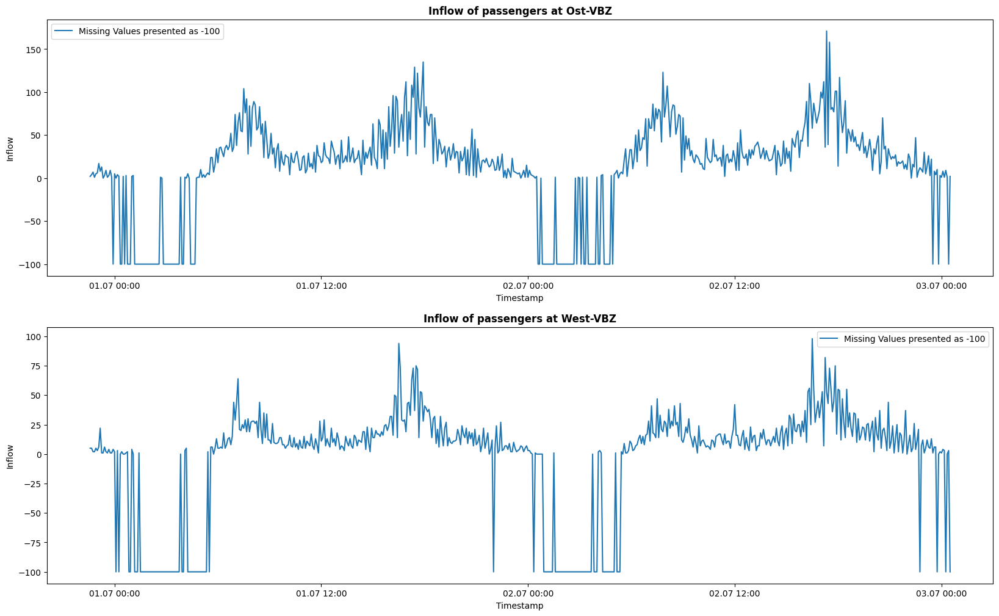

In [9]:
import matplotlib.dates as mdates
#Observe where missing values are located
healed_VBZ_mv = healed_VBZ.copy() #create a copy to work on
healed_VBZ_mv.fillna(-100, inplace = True) #Substitute missing values with negative value (impossible) in order to be able to identify them visually

#Plot the time series 
fig, axs = plt.subplots(2,1, figsize = (20, 12))

for ax in axs:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m %H:%M'))  #create a better readable x-axis
    ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 12])) 
    
axs[0].plot(healed_VBZ_mv["Timestamp"][47900:48500], healed_VBZ_mv["Ost-VBZ Total"][47900:48500])
axs[0].set_xlabel("Timestamp")
axs[0].set_ylabel("Inflow")
axs[0].set_title("Inflow of passengers at Ost-VBZ", weight = "bold")
axs[0].legend(["Missing Values presented as -100"])
axs[1].plot(healed_VBZ_mv["Timestamp"][47900:48500], healed_VBZ_mv["West-VBZ total"][47900:48500])
axs[1].set_xlabel("Timestamp")
axs[1].set_ylabel("Inflow")
axs[1].set_title("Inflow of passengers at West-VBZ", weight = "bold")
axs[1].legend(["Missing Values presented as -100"])

### Dealing with missing values - Interpolation
Missing values seem to be distributed across the whole Timeseries and not concentrated in a single specific time interval of multiple days. However, missing values seem to be appearing in a recurring pattern, with missing values often appearing in night hours (after midnight). Despite this, however, what happens at such an hours in the night isn't too relevant for the model prediction, since these hours where values are missing are typically hours during which there are no passengers flowing in the bus stops of Hardbruecke. 

In order to have a clean Timeseries with equidistant observations, we can subsitute these missing values by interpolation, by taking the mean of the last and the next healthy datapoint available. Since we don't expect huge variations in the number of passengers flowing into the bus stops at such hours in the night, the approximation should depict the reality faithfully enough.

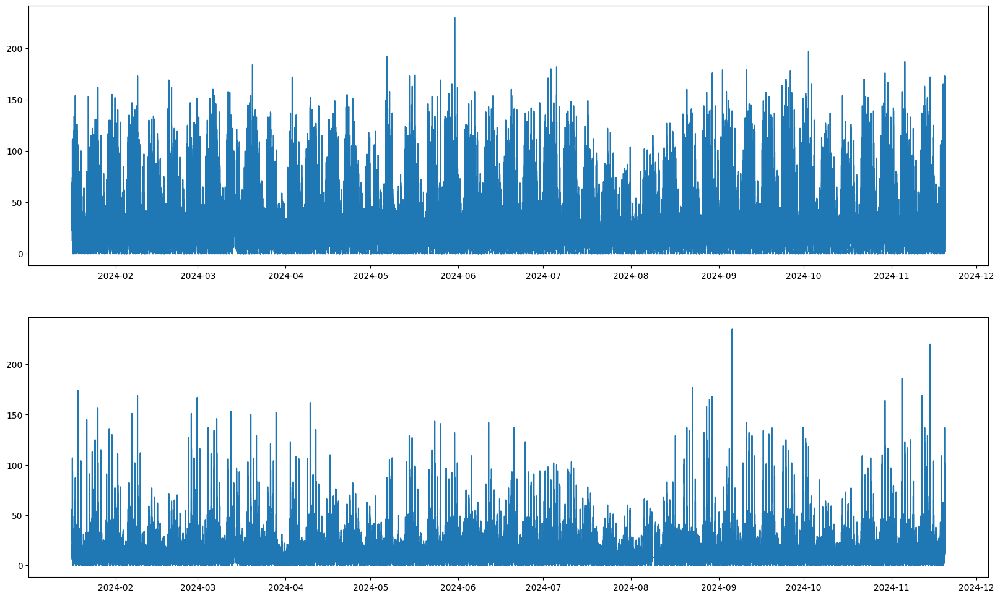

In [10]:
#Create columns with missing values substituted by interpolation, both by taking the value of the next healthy datapoint (forward fill)
# as well as by taking the value of the last available healthy datapoint (backward fill)
Ost_VBZ_Total_ff = healed_VBZ['Ost-VBZ Total'].ffill()
Ost_VBZ_Total_bf = healed_VBZ['Ost-VBZ Total'].bfill()

West_VBZ_total_ff = healed_VBZ['West-VBZ total'].ffill()
West_VBZ_total_bf = healed_VBZ['West-VBZ total'].bfill()

#Interpolate missing values by subsituting them by mean of forward and backward filling
healed_VBZ['Ost-VBZ Total'] = healed_VBZ['Ost-VBZ Total'].fillna((Ost_VBZ_Total_ff + Ost_VBZ_Total_bf) / 2)
healed_VBZ['West-VBZ total'] = healed_VBZ['West-VBZ total'].fillna((West_VBZ_total_ff + West_VBZ_total_bf) / 2)

#plot to see results
fig, axs = plt.subplots(2,1, figsize = (20, 12))
axs[0].plot(healed_VBZ["Timestamp"], healed_VBZ["Ost-VBZ Total"])
axs[1].plot(healed_VBZ["Timestamp"], healed_VBZ["West-VBZ total"])

### Cutting weather and VBZ datasets to let them have the same lenght

In [11]:
# Locate all observations after 16 january to match hardbrücke
#The hardbuecke Dataset has observations every five minutes starting from the 16th of January at 14:55
#Since we don't have data until the end of the current year yet, we can take all datapoints between 2024-01-16 14:55 and 2024-11-16 14:55
#to have exactly 10 months
healed_weather = healed_weather[healed_weather["Timestamp"] >= "2024-01-16 14:55:00"].reset_index(drop = True)
healed_weather = healed_weather[0:87841] #Cut healed_weather dataset for it to contain data from 16th of January 14:55 to the 16th of November 14:55
healed_VBZ = healed_VBZ[0:87841] #Do the same for healed_VBZ Dataset

#Check that the two datasets healed_weather and healed_VBZ have the same lenght
print(len(healed_VBZ) == len(healed_weather))

True


### Adding dummy variable for holidays and variable to day name. Merge healed_VBZ with holidays.

In [12]:
#Dummy for holidays
#Define which days of the years are holidays
#Taken from Zurich Government website
feiertage = pd.DataFrame({
	"Date": ["2024-01-01", "2024-01-02", "2024-03-28", "2024-03-29", "2024-04-01", "2024-04-15", "2024-05-01", "2024-05-08", "2024-05-09",
              "2024-05-10", "2024-05-20", "2024-08-01", "2024-09-09", "2024-12-24", "2024-12-25", "2024-12-26", "2024-12-27", "2024-12-30",
              "2024-12-31"]
})

feiertage["Date"] = pd.to_datetime(feiertage["Date"])
#Add value 1 (True) for holidays
feiertage["Holiday"] = 1

In [13]:
# Create date range for 2024
dates = pd.date_range(start="2024-01-01", end="2024-12-31", freq="D")

# Create a dataframe with names of the days of the week
calendar = pd.DataFrame({
    "Date": dates,
    "Day": dates.day_name()  
})
#Convert date column into datetime format
calendar["Date"] = pd.to_datetime(calendar["Date"])

#Initially assign value 0 (False) under the Holiday feature for all observations
calendar["Holiday"] = 0

# Put value 1 (True) under the Holiday feature for observations that correspond to those ones of feiertage
calendar2 = np.where(calendar["Date"].isin(feiertage["Date"]), 1, 0)
calendar["Holiday"] = calendar2

#Consider weekends as holidays as as well 
calendar.loc[calendar["Day"].isin(["Saturday", "Sunday"]), "Holiday"] = 1

#Extract only Date and Holiday column from the calendar Dataframe, since these ones are the features that we want to integrate in our data
holiday_df = calendar[["Date", "Holiday"]]

#Extend healed_holiday to match granularity of healed_VBZ
def extend_holidays(holiday_df):
    # Create a list to hold the expanded data
    extended_df = []
    
    for _, row in holiday_df.iterrows():
        
        date = pd.Timestamp(row['Date']).date()
        holiday_value = row['Holiday']
        
        # Generate 5-minute intervals for the whole day
        time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")
        
        # Append each timestamp with the holiday value
        extended_df.extend([(timestamp, holiday_value) for timestamp in time_range])
    
    # Create a new DataFrame from the expanded data
    holiday_df_extended = pd.DataFrame(extended_df, columns=["Timestamp", "Holiday"])
    return holiday_df_extended

healed_holiday = extend_holidays(holiday_df)

#Cutting healed_holiday to have the same lenght as healed_VB
healed_holiday = healed_holiday[4499:92340]

#Merge healed_holiday with healed_VBZ
healed_VBZ = pd.merge(healed_VBZ, healed_holiday, on = "Timestamp", how = "inner")

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3393714440.py:36: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")


### Adding features for previous observations up to t-288, which is a whole day.

In [14]:
#Create tow datsetes for Ost and West respectively so we can do a seperate forecasting later
healed_VBZ_ost = healed_VBZ.copy()
healed_VBZ_west = healed_VBZ.copy()

In [15]:
# Assuming healed_VBZ is your DataFrame and 'Timestamp' is in datetime format
healed_VBZ_ost.sort_values(by="Timestamp", ascending=False, inplace=True)

# Define the number of shifts (24 for a whole day)
num_shifts = 288

# Loop to create shifted columns for 'Ost-VBZ Total'
for i in range(1, num_shifts + 1):
    healed_VBZ_ost[f't{-i} Ost-VBZ'] = healed_VBZ_ost['Ost-VBZ Total'].shift(-i)

healed_VBZ_ost.sort_values(by="Timestamp", ascending=True, inplace=True)

healed_VBZ_west.sort_values(by="Timestamp", ascending=False, inplace=True)

# Loop to create shifted columns for 'West-VBZ total'
for i in range(1, num_shifts + 1):
    healed_VBZ_west[f't-{i} West-VBZ'] = healed_VBZ_west['West-VBZ total'].shift(-i)

healed_VBZ_west.sort_values(by="Timestamp", ascending=True, inplace=True)

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3366477083.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  healed_VBZ_ost[f't{-i} Ost-VBZ'] = healed_VBZ_ost['Ost-VBZ Total'].shift(-i)
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3366477083.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  healed_VBZ_ost[f't{-i} Ost-VBZ'] = healed_VBZ_ost['Ost-VBZ Total'].shift(-i)
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3366477083.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of call

### Merging Datasets together

Here we merge the VBZ ost/west data toghether with the weather ost/west data to create an X Matrix to later feed into our models.

In [16]:
#Merge the two dataframes weather and hardbruecke (healed_weather and healed_VBZ)
data_ost = pd.merge(healed_VBZ_ost, healed_weather, on = "Timestamp", how = "inner")
data_west = pd.merge(healed_VBZ_west, healed_weather, on = "Timestamp", how = "inner")
#Now that we included previous obsevations' values as features (up to t-288), there are, of course, new missing values for the first 288 
#observations. There is no data for these missing values, since we built this dataset by taking the first available value of the year 
#2024 from the hardbruecke dataset. To avoid problems in the modelling phase, we therefore drop the fist few days observations.
data_ost = data_ost[data_ost["Timestamp"] >= "2024-01-18 00:00:00"]
data_ost = data_ost[data_ost["Timestamp"] <= "2024-11-15 23:55:00"]
data_west = data_west[data_west["Timestamp"] >= "2024-01-18 00:00:00"]
data_west = data_west[data_west["Timestamp"] <= "2024-11-15 23:55:00"]

#reset index
data_ost = data_ost.reset_index(drop=True)
data_west = data_west.reset_index(drop = True)

# Modelling: AR Modell benchmark prediction

In [17]:
#import relevant packages
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import acf
from statsmodels.graphics.tsaplots import pacf
from statsmodels.tsa.stattools import acf

# Use a nicer style for plots
plt.style.use("seaborn-v0_8-muted")

In [18]:
# Data for the eastern side
df_ost = data_ost[["Timestamp","Ost-VBZ Total"]]
#Data for western side
df_west = data_west[["Timestamp", "West-VBZ total"]]

In [19]:
# test stationarity for the eastern data
result_ost = adfuller(df_ost["Ost-VBZ Total"])
print("ADF Statistic:", result_ost[0])
print("p-value:", result_ost[1])
print("Critical Values:", result_ost[4])
result_ost

ADF Statistic: -35.96972106629919
p-value: 0.0
Critical Values: {'1%': np.float64(-3.4304249950402257), '5%': np.float64(-2.861573146579214), '10%': np.float64(-2.566787642773583)}


(np.float64(-35.96972106629919),
 0.0,
 64,
 87199,
 {'1%': np.float64(-3.4304249950402257),
  '5%': np.float64(-2.861573146579214),
  '10%': np.float64(-2.566787642773583)},
 np.float64(700780.049943808))

In [20]:
# test stationarity for the western data
result_west = adfuller(df_west["West-VBZ total"])
print("ADF Statistic:", result_west[0])
print("p-value:", result_west[1])
print("Critical Values:", result_west[4])
result_west

ADF Statistic: -33.84974370615706
p-value: 0.0
Critical Values: {'1%': np.float64(-3.4304249967604052), '5%': np.float64(-2.8615731473394956), '10%': np.float64(-2.566787643178256)}


(np.float64(-33.84974370615706),
 0.0,
 66,
 87197,
 {'1%': np.float64(-3.4304249967604052),
  '5%': np.float64(-2.8615731473394956),
  '10%': np.float64(-2.566787643178256)},
 np.float64(615740.026274327))

p-values are lower than 0.05 in each case. For a significance level of 5%, both timeseries for Ost and West are therefore stationary and thus no differencing is needed

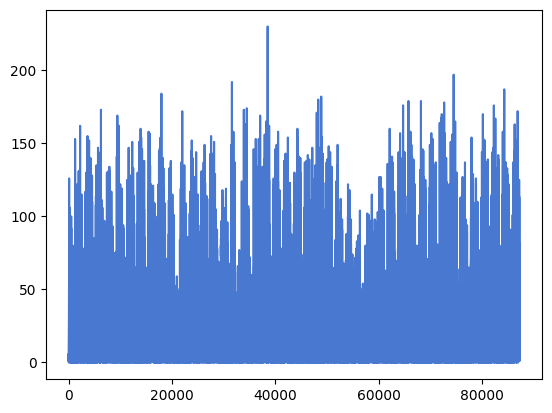

In [21]:
# plot the eastern side 
plt.plot(df_ost["Ost-VBZ Total"])

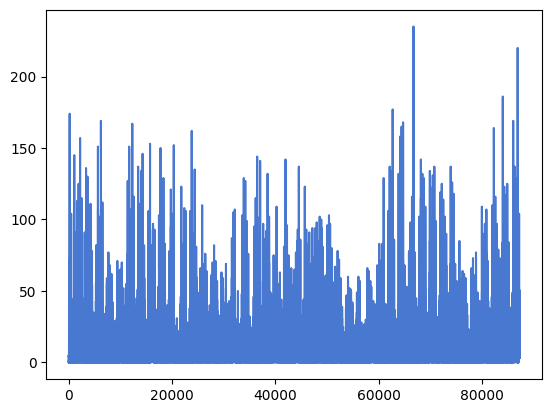

In [22]:
# plot the western side of the dataset
plt.plot(df_west["West-VBZ total"])

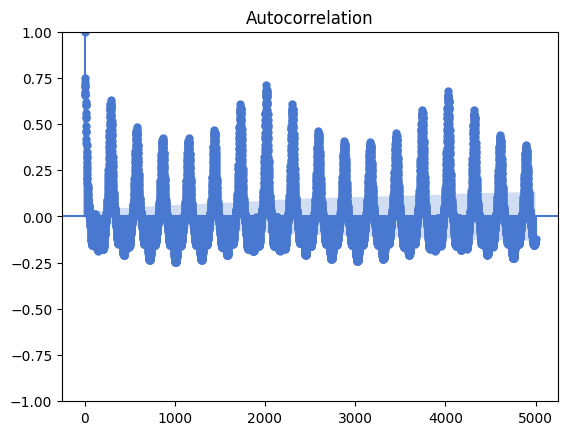

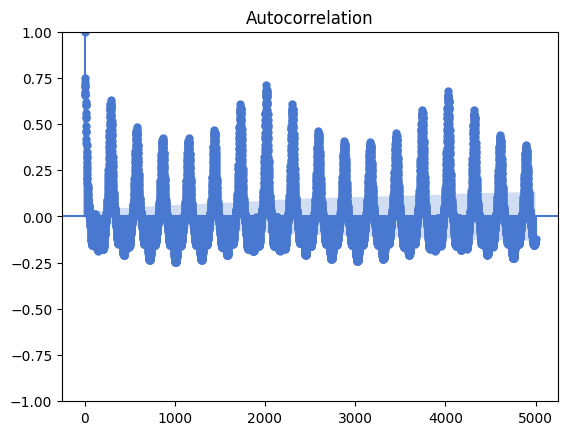

In [23]:
# plot the ACF of the western side of the data
plot_acf(df_ost["Ost-VBZ Total"], lags = 5000)
# it is a sinus function approximately

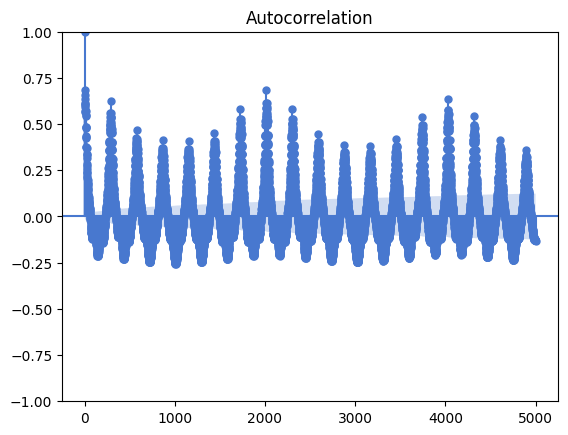

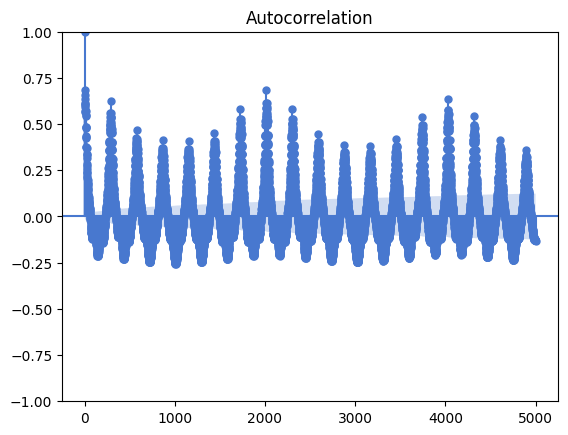

In [24]:
# plot the acf for the western side of the data  side
plot_acf(df_west["West-VBZ total"], lags = 5000)
# like the eastern side, it is a sinus function approximately

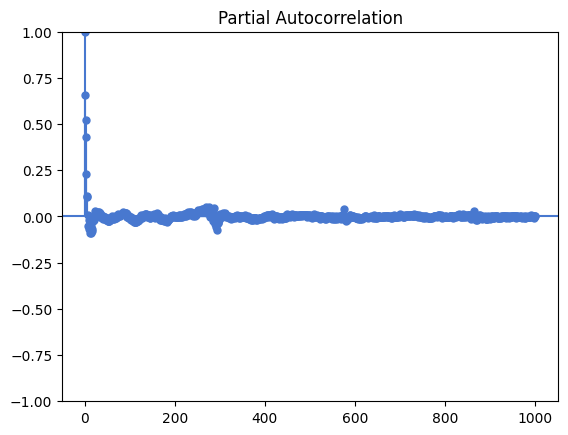

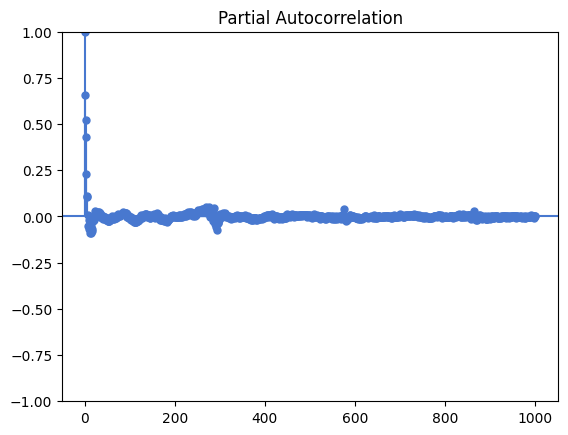

In [25]:
# plot the pacf function for the eastern side
plot_pacf(df_ost["Ost-VBZ Total"], lags = 1000)

# it apparently converges to zero

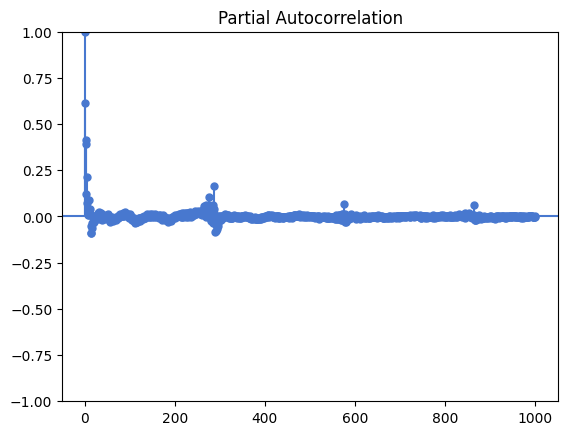

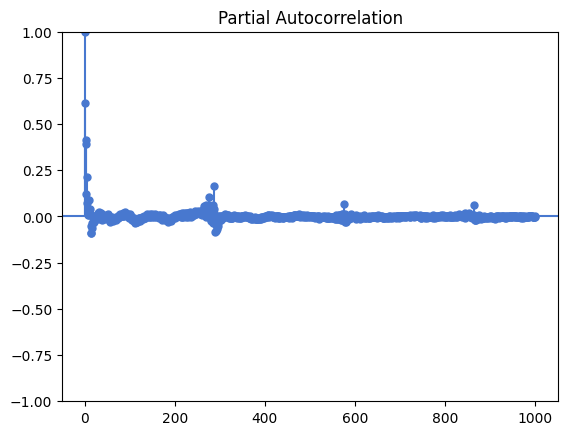

In [26]:
# plot the pacf function for the western side
plot_pacf(df_west["West-VBZ total"], lags = 1000)

# it also apparently convergers to zero

Because the ACFs are sinus functions and the PACFs converge to zero, we come to the conclusion that we should use the AR model (autoregressive) based on the decision table shown in the lecture

In [27]:
# decompostion of the eastern side of the dataset following an addivitive model
decomposition_ost = seasonal_decompose(df_ost["Ost-VBZ Total"], model='additive', period = 1000, filt=None, two_sided=True, extrapolate_trend=0)
decomposition_ost

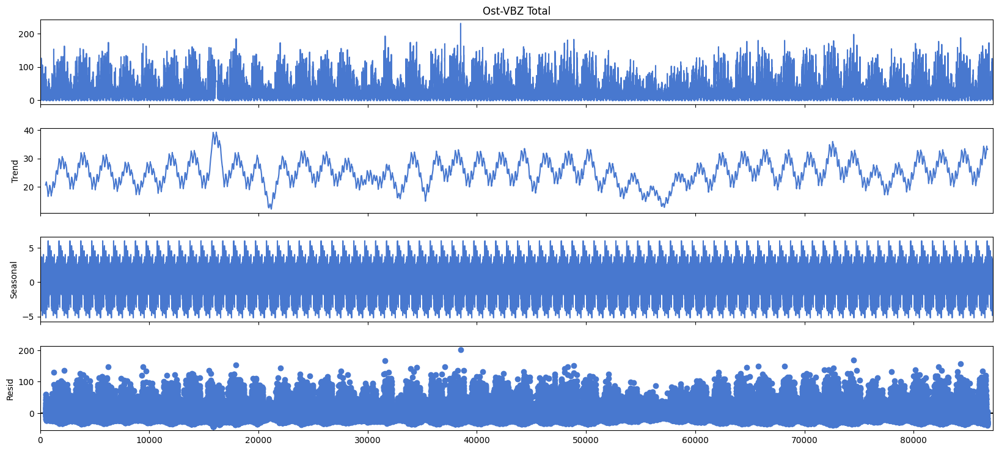

In [28]:
fig = decomposition_ost.plot()
fig.set_size_inches((18, 8))  ##
plt.show()

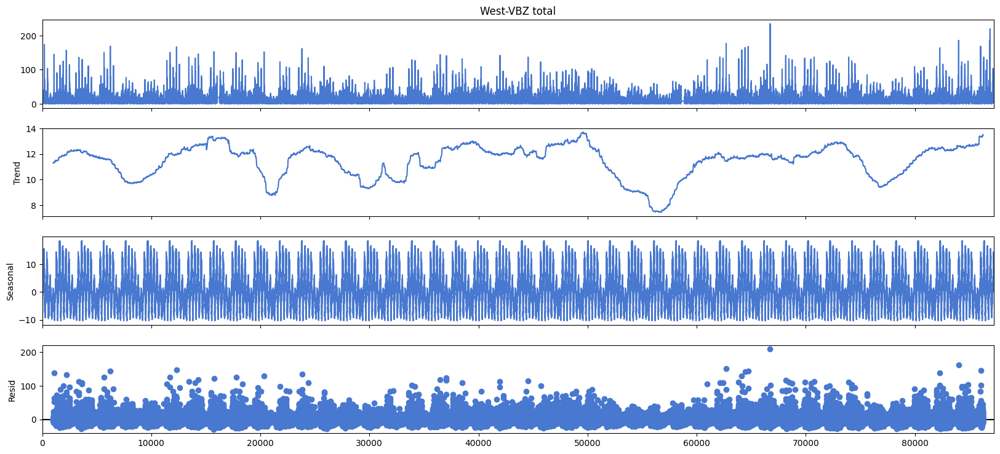

In [29]:
# reproduce the decomposition for the other side foolowing an addiviitve model
decomposition_west = seasonal_decompose(df_west["West-VBZ total"], model='additive', filt=None, period=2018, two_sided=True, extrapolate_trend=0)
decomposition_west
fig = decomposition_west.plot()
fig.set_size_inches((18, 8))  ##
plt.show()

In [30]:
acf_ost = acf(df_ost["Ost-VBZ Total"], fft = True)
acf_ost

array([1.        , 0.65543043, 0.72642597, 0.74864612, 0.70789374,
       0.69954065, 0.71053212, 0.67288632, 0.6567764 , 0.66098521,
       0.62128044, 0.60338262, 0.60346715, 0.561896  , 0.53775169,
       0.53026619, 0.49108163, 0.46322063, 0.45968849, 0.41969755,
       0.39667343, 0.38432468, 0.35010226, 0.32720879, 0.31911992,
       0.28791489, 0.26671933, 0.25322219, 0.23008212, 0.20986318,
       0.20123721, 0.18141865, 0.16515946, 0.15353067, 0.14279515,
       0.12333795, 0.12113355, 0.10728008, 0.09599464, 0.08955518,
       0.08343161, 0.06954025, 0.0703225 , 0.06238854, 0.05416653,
       0.05053735, 0.04893572, 0.03873784, 0.03571646, 0.03512881])

In [31]:
acf_west= acf(df_west["West-VBZ total"], fft = True)
acf_west

array([1.        , 0.6135309 , 0.63568535, 0.68515121, 0.60160125,
       0.59457446, 0.65834427, 0.56597749, 0.57059782, 0.60764737,
       0.54614254, 0.54915686, 0.57242853, 0.48564908, 0.47820901,
       0.48509245, 0.42863875, 0.42732496, 0.43596704, 0.37821104,
       0.37568961, 0.36906753, 0.33850695, 0.33079165, 0.31905845,
       0.28217958, 0.27393185, 0.25866999, 0.24057662, 0.23688347,
       0.22050807, 0.20797258, 0.19858181, 0.17923678, 0.17496581,
       0.16514254, 0.15102853, 0.14753704, 0.1354613 , 0.11718473,
       0.12306476, 0.11536491, 0.09943622, 0.10480378, 0.09357077,
       0.07660906, 0.08567753, 0.07484219, 0.06514063, 0.07064184])

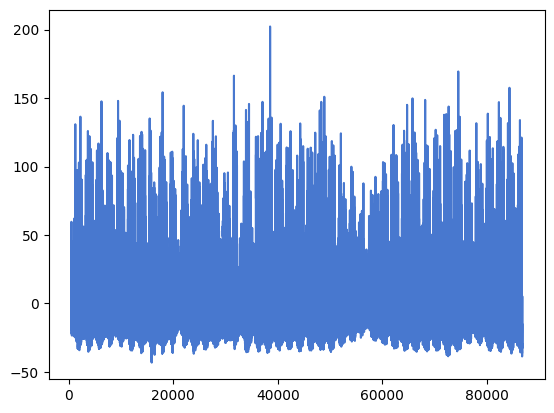

In [32]:
# Plot and Calculate the residuals for the eastern side
residuals_ost = df_ost["Ost-VBZ Total"] - decomposition_ost.trend - decomposition_ost.seasonal
residuals_ost.dropna()

plt.plot(residuals_ost)

plt.show()

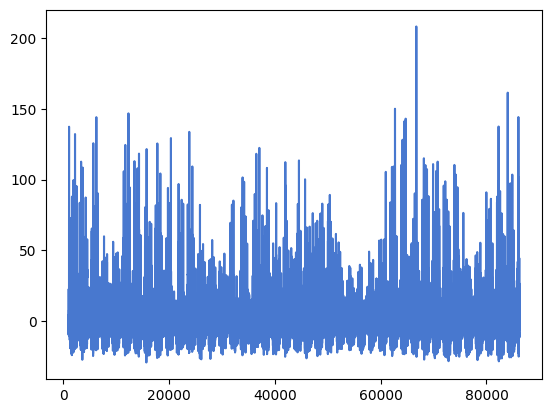

In [33]:
# calculate and plot the residuals of the western side
residuals_west = df_west["West-VBZ total"] - decomposition_west.trend - decomposition_west.seasonal
residuals_west.dropna()

plt.plot(residuals_west)

plt.show()

In [34]:
# Calculate unit root test for residuals on the eastern side
result_residualsost = adfuller(residuals_ost.dropna())
print("ADF Statistic:", result_residualsost[0])
print("p-value:", result_residualsost[1])
print("Critical Values:", result_residualsost[4])
result_residualsost

ADF Statistic: -38.217994799934516
p-value: 0.0
Critical Values: {'1%': np.float64(-3.430425865968449), '5%': np.float64(-2.8615735315103006), '10%': np.float64(-2.5667878476598966)}


(np.float64(-38.217994799934516),
 0.0,
 65,
 86198,
 {'1%': np.float64(-3.430425865968449),
  '5%': np.float64(-2.8615735315103006),
  '10%': np.float64(-2.5667878476598966)},
 np.float64(690987.7514214548))

In [35]:
# Calculate unit root test for residuals on the western side
result_residualswest = adfuller(residuals_west.dropna())
print("ADF Statistic:", result_residualswest[0])
print("p-value:", result_residualswest[1])
print("Critical Values:", result_residualswest[4])
result_residualswest

ADF Statistic: -40.81942640421897
p-value: 0.0
Critical Values: {'1%': np.float64(-3.4304267726822726), '5%': np.float64(-2.8615739322577136), '10%': np.float64(-2.5667880609647478)}


(np.float64(-40.81942640421897),
 0.0,
 65,
 85180,
 {'1%': np.float64(-3.4304267726822726),
  '5%': np.float64(-2.8615739322577136),
  '10%': np.float64(-2.5667880609647478)},
 np.float64(596861.1078129507))

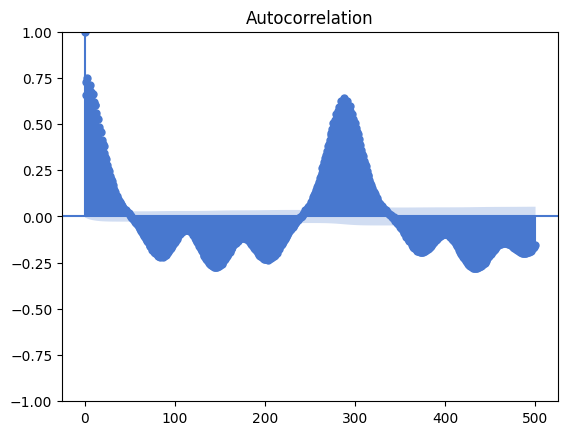

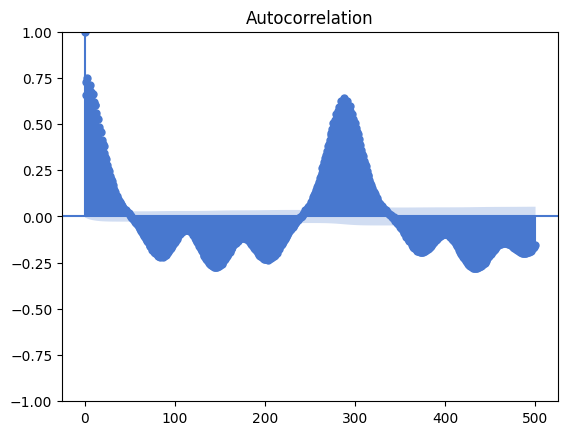

In [36]:
# Plot the ACF function for the residuals on the eastern side 
plot_acf(residuals_ost.dropna(),lags = 500)

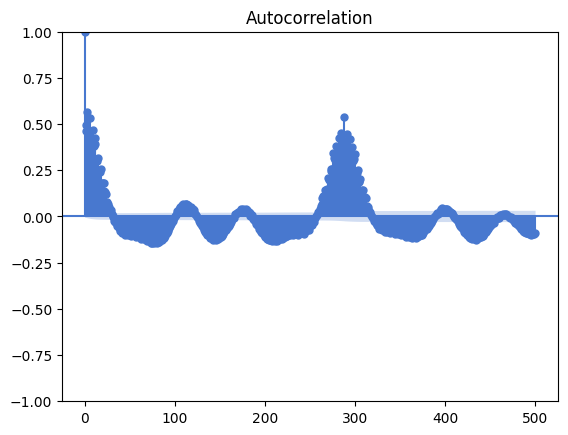

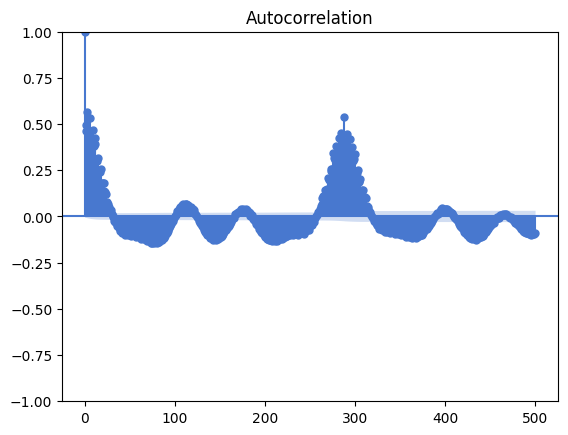

In [37]:
# Plot the ACF function for the residuals on the western side 

plot_acf(residuals_west.dropna(),lags = 500)

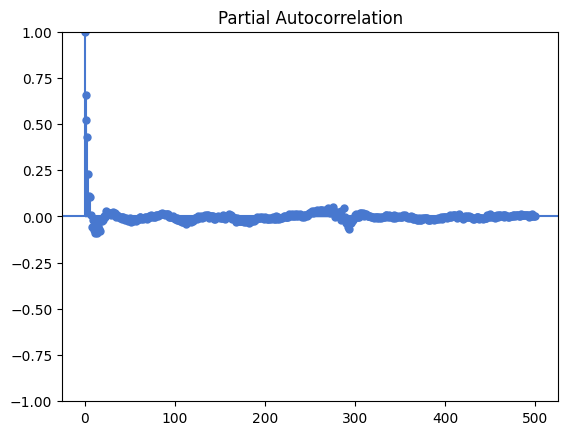

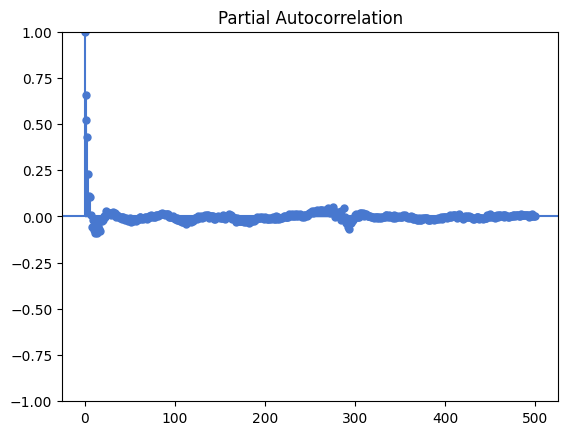

In [38]:
# Plot the PACF function for the residuals on the eastern side 

plot_pacf(residuals_ost.dropna(),lags = 500)

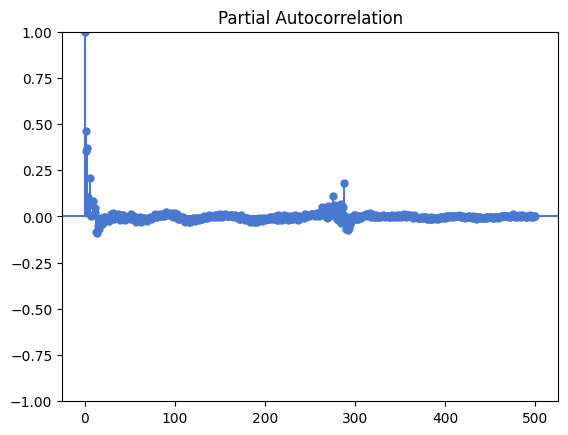

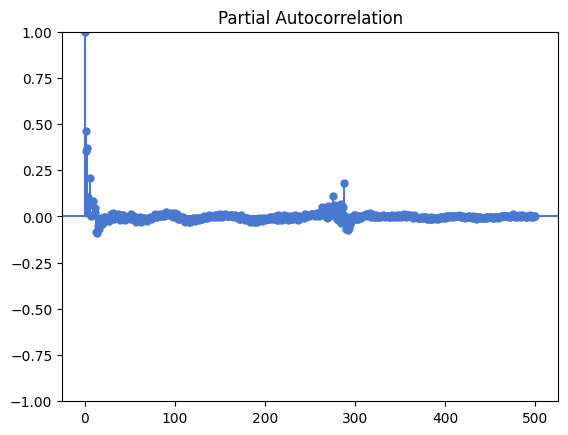

In [39]:
# Plot the PACF function for the residuals on the Western side 

plot_pacf(residuals_west.dropna(),lags = 500)

In [40]:
# Forecasting for the ost side
# We train our model with train_ost and test_ost
import sklearn.metrics
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.api import AutoReg
from sklearn.metrics import mean_absolute_error, mean_squared_error
df_ost["Ost-VBZ Total"]
df_west["West-VBZ total"]
# 80.58% for training  following a expanding window validation
# we choose this exact number to have full days in our training and testing sets
# In addition, it allows us to have full weeks for our training set (35 weeks)
# We tried two percentages for our training set: 0.8 and 0.8085.
# We came to the conclusion that our forecast performed somewhat better
# with the 0.8085%. Therefore we decide to apply this value in our model.
# However, we'll use the value of 0.8% (or 4 splits) for our cross-validation below to have
# training and testing sets of equal size.

df_ost_train = int(len(df_ost)*0.808580858085808580858085808580858085808580858085)
train_ost ,test_ost = df_ost[:df_ost_train], df_ost[df_ost_train:]

from sklearn.model_selection import TimeSeriesSplit
# rolling windows
tscv = TimeSeriesSplit(n_splits=10)

len(train_ost),len(test_ost)
# We have (70560/288 = 245) days in our training set and 58 days for our testing set 

(70560, 16704)

In [41]:
# Create and train the autoregressive model
# determine number of lags
lags = 288
ar_model_ost = AutoReg(train_ost["Ost-VBZ Total"], lags=lags)
results_ar_ost = ar_model_ost.fit()

In [42]:
# Make predictions on the testing set for the eastern side
y_pred_ost = results_ar_ost.predict(start=len(train_ost["Ost-VBZ Total"]), end=len(train_ost["Ost-VBZ Total"]) + len(test_ost["Ost-VBZ Total"])-1)

In [43]:
# Calculate MAE and RMSE for the eastern side
mae_ost = mean_absolute_error(test_ost["Ost-VBZ Total"], y_pred_ost)
rmse_ost = mean_squared_error(test_ost["Ost-VBZ Total"], y_pred_ost)
print(f'Mean Absolute Error: {mae_ost:.2f}')
print(f'Root Mean Squared Error: {rmse_ost:.2f}')

Mean Absolute Error: 18.66
Root Mean Squared Error: 647.69


C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2464037810.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ost["Timestamp"] = pd.to_datetime(test_ost["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2464037810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ost["Timestamp"] = pd.to_datetime(train_ost["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2464037810.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' i

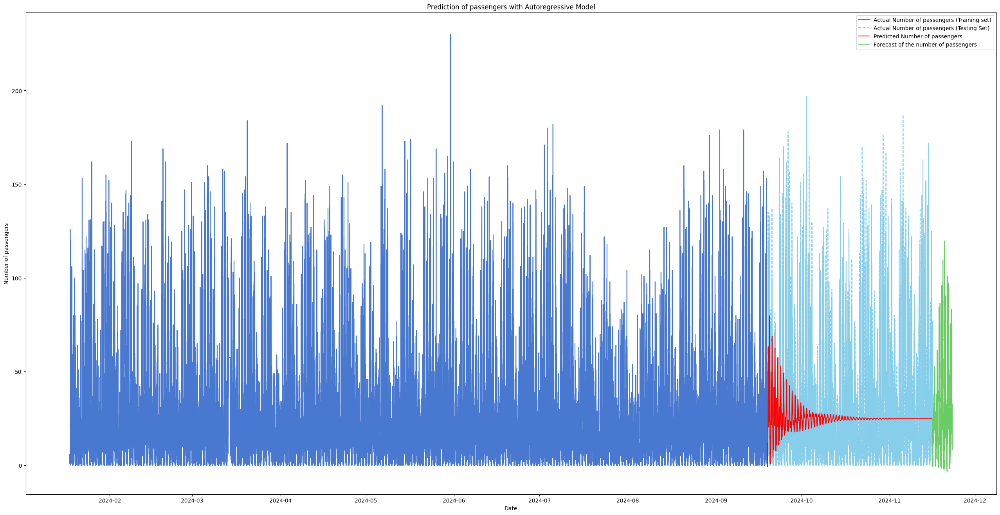

In [44]:
# Number of 5 minutes intervals in one day (288)
day = 288
# Number of 5-minutes intervals in our week (7 days)
forecast_steps_ost = 7*day
# convert stamp into datetime
test_ost["Timestamp"] = pd.to_datetime(test_ost["Timestamp"])
train_ost["Timestamp"] = pd.to_datetime(train_ost["Timestamp"])

# Make future predictions
future_predictions_ost = results_ar_ost.predict(start=len(test_ost), end=len(test_ost) + forecast_steps_ost - 1)
# determine future dates
future_dates_ost = pd.date_range(start=test_ost["Timestamp"].iloc[-1], periods=forecast_steps_ost, freq='5T')

# Plot training set, testing set, prediction on our data testing set, and future predictions
plt.figure(figsize=(32, 16))
plt.plot(train_ost["Timestamp"],train_ost["Ost-VBZ Total"], label = "Actual Number of passengers (Training set)")
plt.plot(test_ost["Timestamp"],test_ost["Ost-VBZ Total"], label='Actual Number of passengers (Testing Set)', linestyle = "--",color = "skyblue")
plt.plot(test_ost["Timestamp"],y_pred_ost, label='Predicted Number of passengers', color = "red")
plt.plot(future_dates_ost, future_predictions_ost, label = "Forecast of the number of passengers")

plt.xlabel('Date')
plt.ylabel('Number of passengers')
plt.legend()
plt.title('Prediction of passengers with Autoregressive Model')
plt.show()



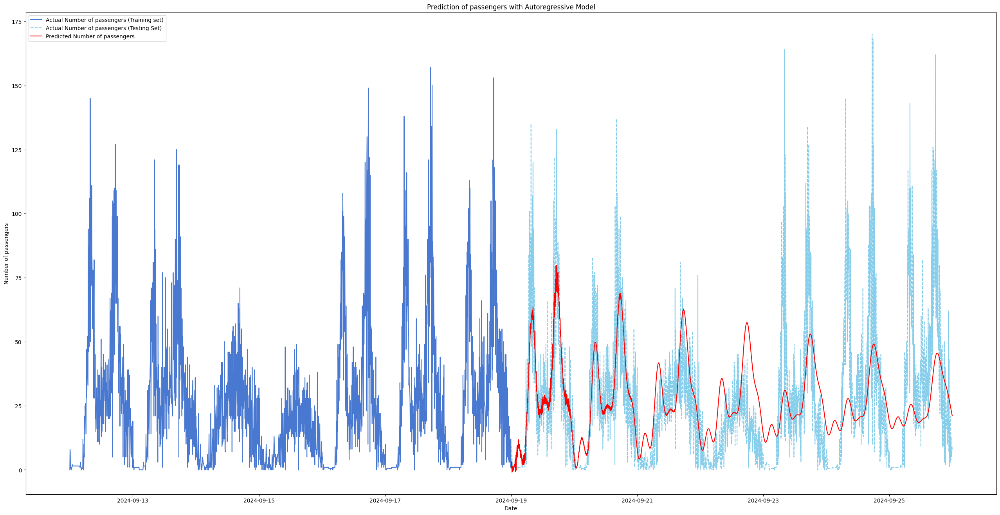

In [45]:
# Define the number of future time steps you want to predict (1 week)
forecast_steps_ost = 7*day

# Extend the predictions into the future for one week
future_indices = range(len(test_ost), len(test_ost) + forecast_steps_ost)
# enter prediction date
future_predictions = results_ar_ost.predict(start=len(train_ost), end=len(train_ost) + len(test_ost) + forecast_steps_ost - 1)


# Plot the testing data, training data, and predictions on our testing data for one week
plt.figure(figsize=(32, 16))
plt.plot(train_ost["Timestamp"][len(train_ost)-forecast_steps_ost:],train_ost["Ost-VBZ Total"][len(train_ost)-forecast_steps_ost:], label = "Actual Number of passengers (Training set)")
plt.plot(test_ost["Timestamp"][:forecast_steps_ost],test_ost["Ost-VBZ Total"][:forecast_steps_ost], label='Actual Number of passengers (Testing Set)', linestyle = "--",color = "skyblue")
plt.plot(test_ost["Timestamp"][:forecast_steps_ost],y_pred_ost[:forecast_steps_ost], label='Predicted Number of passengers', color = "red")

plt.xlabel('Date')
plt.ylabel('Number of passengers')
plt.legend()
plt.title('Prediction of passengers with Autoregressive Model')
plt.show()

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3593924651.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ost["Timestamp"] = pd.to_datetime(test_ost["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3593924651.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ost["Timestamp"] = pd.to_datetime(train_ost["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\3593924651.py:10: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' i

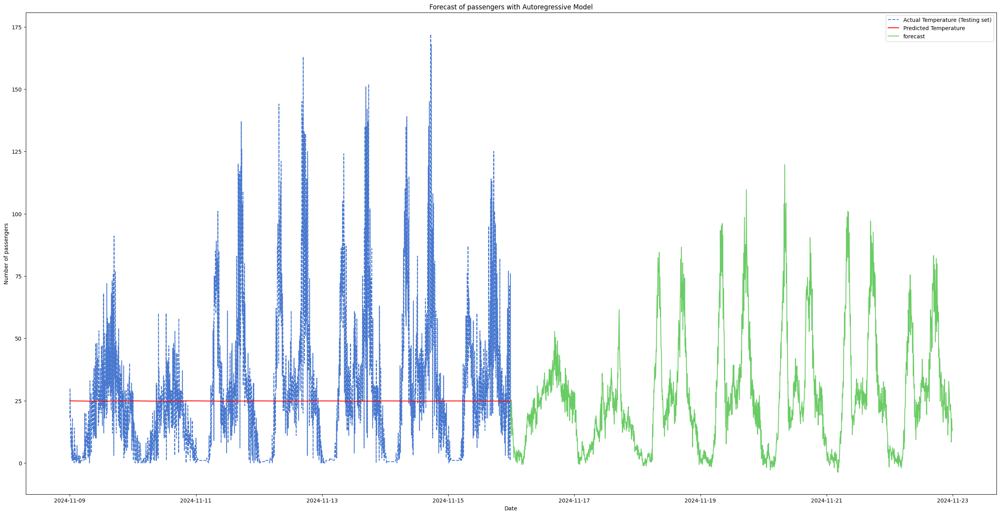

In [46]:
# Define the number of future time steps you want to predict (7 days)
forecast_steps_ost = 7*day
# convert stamp into datetime
test_ost["Timestamp"] = pd.to_datetime(test_ost["Timestamp"])
train_ost["Timestamp"] = pd.to_datetime(train_ost["Timestamp"])

# Extend the predictions into the future for one year 
future_indices_ost = range(len(test_ost), len(test_ost) + forecast_steps_ost)
future_predictions_ost = results_ar_ost.predict(start=len(test_ost), end=len(test_ost) + forecast_steps_ost - 1)
future_dates_ost = pd.date_range(start=test_ost["Timestamp"].iloc[-1], periods=forecast_steps_ost, freq='5T')

# Create date indices for the future predictions

# Plot the actual data in the testing set, predictions on the testing set, and one week of future predictions
plt.figure(figsize=(32, 16))
plt.plot(test_ost["Timestamp"][len(test_ost)-forecast_steps_ost:], test_ost["Ost-VBZ Total"][len(test_ost)-forecast_steps_ost:], label='Actual Temperature (Testing set)', linestyle = "--")
plt.plot(test_ost["Timestamp"][len(test_ost)-forecast_steps_ost:], y_pred_ost[len(test_ost)-forecast_steps_ost:], label='Predicted Temperature', color = "red")
plt.plot(future_dates_ost, future_predictions_ost[-forecast_steps_ost:], label ="forecast")
plt.xlabel('Date')
plt.ylabel('Number of passengers')
plt.legend()
plt.title('Forecast of passengers with Autoregressive Model')
plt.show()

In [47]:
# Reproduce the model with the other side:
df_west_train = int(len(df_west)*0.808580858085808580858085808580858085808580858085)
train_west ,test_west = df_west[:df_west_train], df_west[df_west_train:]

from sklearn.model_selection import TimeSeriesSplit
# rolling windows
tscv = TimeSeriesSplit(n_splits=10)

len(train_west),len(test_west)

(70560, 16704)

In [48]:
# Create and train the autoregressive model
ar_model_west = AutoReg(train_west["West-VBZ total"], lags=lags)
results_ar_west = ar_model_west.fit()

In [49]:
# Make predictions on the test set
y_pred_west = results_ar_west.predict(start=len(train_west["West-VBZ total"]), end=len(train_west["West-VBZ total"]) + len(test_west["West-VBZ total"])-1)


In [50]:
mae_west = mean_absolute_error(test_west["West-VBZ total"], y_pred_west)
rmse_west = mean_squared_error(test_west["West-VBZ total"], y_pred_west)
print(f'Mean Absolute Error: {mae_west:.2f}')
print(f'Root Mean Squared Error: {rmse_west:.2f}')

Mean Absolute Error: 9.45
Root Mean Squared Error: 199.57


C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\410346417.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_west["Timestamp"] = pd.to_datetime(test_west["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\410346417.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_west["Timestamp"] = pd.to_datetime(train_west["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\410346417.py:9: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' i

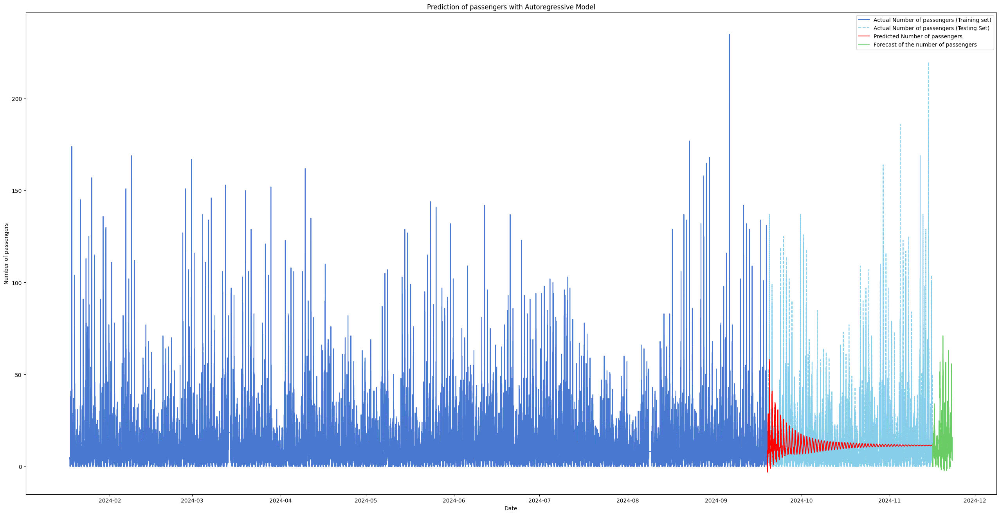

In [51]:
day = 288
forecast_steps_west = 7*day
# convert stamp
test_west["Timestamp"] = pd.to_datetime(test_west["Timestamp"])
train_west["Timestamp"] = pd.to_datetime(train_west["Timestamp"])

#future_indices_ost = range(len(test_ost), len(test_ost) + forecast_steps_ost)
future_predictions_west = results_ar_west.predict(start=len(test_west), end=len(test_west) + forecast_steps_west - 1)
future_dates_west = pd.date_range(start=test_west["Timestamp"].iloc[-1], periods=forecast_steps_west, freq='5T')

# Plot the actual data, existing predictions, and one year of future predictions
plt.figure(figsize=(32, 16))
plt.plot(train_west["Timestamp"],train_west["West-VBZ total"], label = "Actual Number of passengers (Training set)")
plt.plot(test_west["Timestamp"],test_west["West-VBZ total"], label='Actual Number of passengers (Testing Set)', linestyle = "--",color = "skyblue")
plt.plot(test_west["Timestamp"],y_pred_west, label='Predicted Number of passengers', color = "red")
plt.plot(future_dates_west, future_predictions_west, label = "Forecast of the number of passengers")

plt.xlabel('Date')
plt.ylabel('Number of passengers')
plt.legend()
plt.title('Prediction of passengers with Autoregressive Model')
plt.show()

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\62001311.py:5: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  future_dates_west = pd.date_range(start=test_west["Timestamp"].iloc[-1], periods=forecast_steps_west, freq='5T')


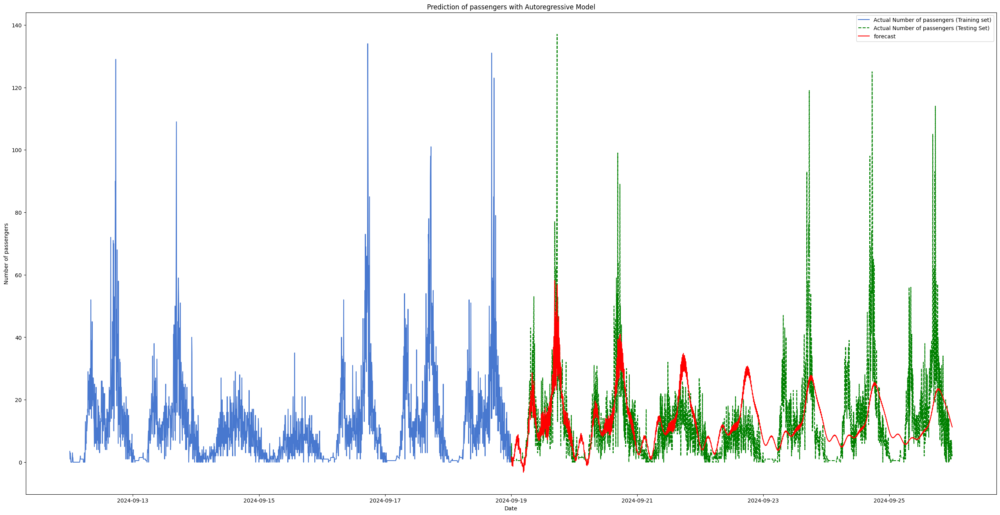

In [52]:
# Define the number of future time steps you want to predict (1 week)

#future_indices_ost = range(len(test_ost), len(test_ost) + forecast_steps_ost)
future_predictions_west = results_ar_west.predict(start=len(test_west), end=len(test_west) + forecast_steps_west - 1)
future_dates_west = pd.date_range(start=test_west["Timestamp"].iloc[-1], periods=forecast_steps_west, freq='5T')

# Create date indices for the future predictions

# Plot the actual data, existing predictions, and one year of future predictions
plt.figure(figsize=(32, 16))
plt.plot(train_west["Timestamp"][len(train_ost)-forecast_steps_west:],train_west["West-VBZ total"][len(train_west)-forecast_steps_west:], label = "Actual Number of passengers (Training set)")
plt.plot(test_west["Timestamp"][:forecast_steps_west],test_west["West-VBZ total"][:forecast_steps_west], label='Actual Number of passengers (Testing Set)', linestyle = "--",color = "green")
plt.plot(test_west["Timestamp"][:forecast_steps_west], y_pred_west[:forecast_steps_west], label ="forecast", color = "red")

plt.xlabel('Date')
plt.ylabel('Number of passengers')
plt.legend()
plt.title('Prediction of passengers with Autoregressive Model')
plt.show()

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2718219508.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_west["Timestamp"] = pd.to_datetime(test_west["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2718219508.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_west["Timestamp"] = pd.to_datetime(train_west["Timestamp"])
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2718219508.py:10: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'mi

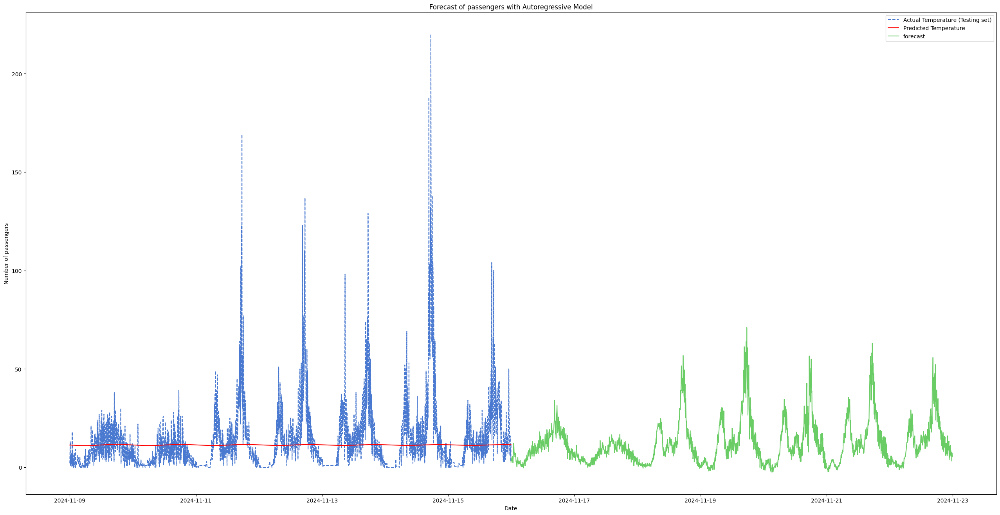

In [53]:
# Define the number of future time steps you want to predict (1 day)
forecast_steps_west = 7*day
# convert stamp
test_west["Timestamp"] = pd.to_datetime(test_west["Timestamp"])
train_west["Timestamp"] = pd.to_datetime(train_west["Timestamp"])

# Extend the predictions into the future for one year
future_indices_west = range(len(test_west), len(test_west) + forecast_steps_west)
future_predictions_west = results_ar_west.predict(start=len(test_west), end=len(test_west) + forecast_steps_west - 1)
future_dates_west = pd.date_range(start=test_west["Timestamp"].iloc[-1], periods=forecast_steps_west, freq='5T')

# Create date indices for the future predictions

# Plot the actual data, existing predictions, and one year of future predictions
plt.figure(figsize=(32, 16))
plt.plot(test_west["Timestamp"][len(test_west)-forecast_steps_west:], test_west["West-VBZ total"][len(test_west)-forecast_steps_west:], label='Actual Temperature (Testing set)', linestyle = "--")
plt.plot(test_west["Timestamp"][len(test_west)-forecast_steps_west:], y_pred_west[len(test_west)-forecast_steps_west:], label='Predicted Temperature', color = "red")
plt.plot(future_dates_west, future_predictions_west[-forecast_steps_west:], label ="forecast")
plt.xlabel('Date')
plt.ylabel('Number of passengers')
plt.legend()
plt.title('Forecast of passengers with Autoregressive Model')
plt.show()

In [54]:
# Cross-validation for the eastern side of the bridge with 4 splits :

data_cv_ost = df_ost['Ost-VBZ Total']
# Define TimeSeriesSplit
n_splits = 4  
tscv = TimeSeriesSplit(n_splits=n_splits)

# Initialize lists to store results
mse_scores = []

# Perform TimeSeriesSplit
for train_index, test_index in tscv.split(df_ost):
    train, test = df_ost.iloc[train_index], df_ost.iloc[test_index]
    
    # Train AutoReg model using the 'Ost-VBZ Total' column from the training set
    model = AutoReg(train['Ost-VBZ Total'], lags=288)
    model_fit = model.fit()
    
    # Predict on the test set
    predictions = model_fit.predict(start=test.index[0], end=test.index[-1])
    
    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(test['Ost-VBZ Total'], predictions)
    mse_scores.append(mse)

    print(f"Train size: {len(train)}, Test size: {len(test)}, MSE: {mse:.4f}")

# Print the mean MSE
average_mse = np.mean(mse_scores)
print(f"Average MSE across splits: {average_mse:.4f}")

Train size: 17456, Test size: 17452, MSE: 549.0656
Train size: 34908, Test size: 17452, MSE: 653.5668
Train size: 52360, Test size: 17452, MSE: 501.4972
Train size: 69812, Test size: 17452, MSE: 646.7479
Average MSE across splits: 587.7194


In [55]:
# Cross-validation for the western side of the bridge with 4 splits:

data_cv_west = df_west["West-VBZ total"]
# Define TimeSeriesSplit
n_splits = 4  # Number of train-test splits
tscv = TimeSeriesSplit(n_splits=n_splits)

# Initialize lists to store results
mse_scores = []

# Perform TimeSeriesSplit
for train_index_west, test_index_west in tscv.split(data_cv_west):
    train, test = data_cv_west.iloc[train_index_west], data_cv_west.iloc[test_index_west]
    
    # Train AutoReg model using the 'Ost-VBZ Total' column from the training set
    model = AutoReg(train, lags=288)
    model_fit = model.fit()
    
    # Predict on the test set
    predictions = model_fit.predict(start=test.index[0], end=test.index[-1])
    
    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(test, predictions)
    mse_scores.append(mse)

    print(f"Train size: {len(train)}, Test size: {len(test)}, MSE: {mse:.4f}")

# Print the mean MSE
average_mse = np.mean(mse_scores)
print(f"Average MSE across splits: {average_mse:.4f}")

Train size: 17456, Test size: 17452, MSE: 154.8818
Train size: 34908, Test size: 17452, MSE: 181.4274
Train size: 52360, Test size: 17452, MSE: 144.6857
Train size: 69812, Test size: 17452, MSE: 203.3090
Average MSE across splits: 171.0760


# Modelling - Random Forest predictions

To use our X Matrices in the models we need to exclude the timestamp variables as well as the y variable to prevent data leakage. We split training and test data at a predefined threshhold, which was also used for the AR Model, in order to ensure we're training the model on the same training set. We don't shuffle observation when creating training and test sets, as to respect the chronological order of observations

In [56]:

#Define Design matrix and outcome variables
y_ost = data_ost["Ost-VBZ Total"]
y_west = data_west["West-VBZ total"]

exclude_columns_ost = ["Timestamp", 
                       "Ost-VBZ Total" ,
                       "West-VBZ total"
                       ]
exclude_columns_west = ["Timestamp", 
                       "West-VBZ total",
                       "Ost-VBZ Total" 
                       ]

X_ost = data_ost.drop(columns = exclude_columns_ost)
X_west = data_west.drop(columns = exclude_columns_west)
#Split into training and test data 
from sklearn.model_selection import train_test_split

threshold_train = 0.808580858085808580858085808580858085808580858085 #Same threshold used for AR model
threshold_test = 1- threshold_train

X_ost_train, X_ost_test, y_ost_train, y_ost_test = train_test_split(X_ost, y_ost, shuffle = False, test_size = threshold_test)
X_west_train, X_west_test, y_west_train, y_west_test = train_test_split(X_west, y_west, shuffle = False, test_size = threshold_test)

In [57]:
y_ost

0         1.0
1         3.5
2         6.0
3         2.0
4         1.5
         ... 
87259     1.0
87260    76.0
87261    26.0
87262    21.0
87263    18.0
Name: Ost-VBZ Total, Length: 87264, dtype: float64

In [58]:
#Shift holiday variable to the right (needed for final models to function properly)
X_west_train = X_west_train.assign(Holiday=X_west_train.pop('Holiday'))
X_ost_train = X_ost_train.assign(Holiday=X_ost_train.pop('Holiday'))

X_west_test = X_west_test.assign(Holiday=X_west_test.pop('Holiday'))
X_ost_test = X_ost_test.assign(Holiday=X_ost_test.pop('Holiday'))

#Reset indexes of X_west_train and X_ost_train to 0 to properly index below
X_west_train = X_west_train.reset_index().drop(columns = "index")
X_ost_train = X_ost_train.reset_index().drop(columns = "index")

X_west_test_reduced = X_west_test.reset_index().drop(columns = "index")
X_ost_test_reduced = X_ost_test.reset_index().drop(columns = "index")

### Predicting inflow of passengers in Ost

In [59]:
#Import RandomForest Regressor
from sklearn.ensemble import RandomForestRegressor

RF_ost = RandomForestRegressor(n_estimators = 200, max_features = "sqrt", random_state = 72 )

#Train RandomForest Regressor for Ost 
RF_ost.fit(X_ost_train, y_ost_train)

#Predict for train set
y_ost_predict_train = RF_ost.predict(X_ost_train)
y_ost_predict_test = RF_ost.predict(X_ost_test)

# Import the mean_squared_error function under the alias mse
from sklearn.metrics import mean_squared_error as mse

#Show MSE
print("Ost Train MSE:", mse(y_ost_train, y_ost_predict_train))
print("Ost Test MSE:", mse(y_ost_test, y_ost_predict_test))

Ost Train MSE: 21.61835404327877
Ost Test MSE: 172.30381126077586


In [60]:
RF_west = RandomForestRegressor(n_estimators = 200, max_features = "sqrt", random_state = 72)

#Train RandomForest Regressor for West
RF_west.fit(X_west_train, y_west_train)

#Predict for train and test sets
y_west_predict_train = RF_west.predict(X_west_train)
y_west_predict_test = RF_west.predict(X_west_test)

#Show MSE
print("West Train MSE:", mse(y_west_train, y_west_predict_train))
print("West Test MSE:", mse(y_west_test, y_west_predict_test))

West Train MSE: 7.310888977820295
West Test MSE: 59.942280790155046


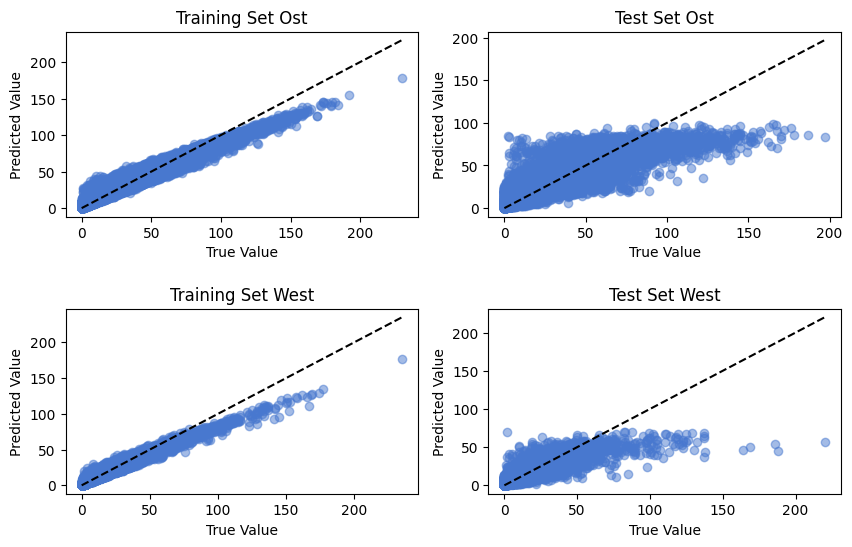

In [61]:
# Plot our predictions
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

# Plot the training data Ost
axs[0,0].scatter(y_ost_train, y_ost_predict_train, alpha=0.5, label="train")
# Plot a diagonal line
axs[0,0].plot(*[[np.minimum(y_ost_train.min(), y_ost_predict_train.min()), 
               np.maximum(y_ost_train.max(), y_ost_predict_train.max())] for _ in range(2)],
              color = "black", ls="--")
axs[0,0].set_title("Training Set Ost")
axs[0,0].set_xlabel("True Value")
axs[0,0].set_ylabel("Predicted Value")

# Plot the test data Ost
axs[0,1].scatter(y_ost_test, y_ost_predict_test, alpha=0.5, label="test")
# Plot a diagonal line
axs[0,1].plot(*[[np.minimum(y_ost_test.min(), y_ost_predict_test.min()), 
               np.maximum(y_ost_test.max(), y_ost_predict_test.max())] for _ in range(2)],
              color = "black", ls="--")
axs[0,1].set_title("Test Set Ost")
axs[0,1].set_xlabel("True Value")
axs[0,1].set_ylabel("Predicted Value")

# Plot the training data West
axs[1,0].scatter(y_west_train, y_west_predict_train, alpha=0.5, label="train")
# Plot a diagonal line
axs[1,0].plot(*[[np.minimum(y_west_train.min(), y_west_predict_train.min()), 
               np.maximum(y_west_train.max(), y_west_predict_train.max())] for _ in range(2)],
              color = "black", ls="--")
axs[1,0].set_title("Training Set West")
axs[1,0].set_xlabel("True Value")
axs[1,0].set_ylabel("Predicted Value")

# Plot the test data West
axs[1,1].scatter(y_west_test, y_west_predict_test, alpha=0.5, label="test")
# Plot a diagonal line
axs[1,1].plot(*[[np.minimum(y_west_test.min(), y_west_predict_test.min()), 
               np.maximum(y_west_test.max(), y_west_predict_test.max())] for _ in range(2)],
              color = "black", ls="--")
axs[1,1].set_title("Test Set West")
axs[1,1].set_xlabel("True Value")
axs[1,1].set_ylabel("Predicted Value")

plt.subplots_adjust(hspace = 0.5)

The initially trained Random Forest models seem to be overfitting a bit. We now consider dropping some uninmportant features that might be just generating unnecessary noise. We generate a features importance plot to see which weather variables might be unnecessary. 

### Feature Importance Plot to assess which variables should be droped


In [62]:
#Define a function that plot the importance of features of the model
def plot_variable_importance(model, X_train):
    # Create a DataFrame with the feature importance of the model
    imp = pd.DataFrame({"imp": model.feature_importances_, "names": X_train.columns}).sort_values(by="imp", ascending=True)
    fig, ax = plt.subplots(figsize= (imp.shape[0]/6,imp.shape[0]/4), dpi = 300)
    
    
    # Plot the feature importance
    ax.barh(imp["names"], imp["imp"], color = "skyblue")
    ax.set_xlabel("\nFeature Importance", fontsize = 40)
    ax.set_ylabel("Features\n", fontsize = 40)
    ax.set_title("Variable Importance\n", fontsize = 50)
    plt.show()

In [63]:
plot_variable_importance(RF_ost, X_ost_train)

In [64]:
plot_variable_importance(RF_west, X_west_train)

In [65]:
#See with numbers how important each feature is and drop only weather features
importance_ost = pd.DataFrame({"imp": RF_ost.feature_importances_, "names": X_ost_train.columns}).sort_values(by="imp", ascending=True)
drop_ost = importance_ost[importance_ost["imp"] < 0.00115]
drop_list_ost = drop_ost["names"].to_list()

importance_west = pd.DataFrame({"imp": RF_west.feature_importances_, "names": X_west_train.columns}).sort_values(by="imp", ascending=True)
importance_west[importance_west["imp"] < 0.0010]
drop_west = importance_west[importance_west["imp"] < 0.010]
drop_list_west = drop_west["names"].to_list()

drop_list_ost = [feature for feature in drop_list_ost if feature in weather.columns]
drop_list_ost
importance_ranked_ost = importance_ost[importance_ost["names"].isin(weather.columns)].sort_values(by="imp", ascending=False)
importance_ranked_ost.rename(columns = {"names": "Weather Features", "imp": "Importance"}, inplace = True)
importance_ranked_ost["Importance"] = importance_ranked_ost["Importance"].round(6)
importance_ranked_ost.reset_index(drop = True, inplace = True)

drop_list_west = [feature for feature in drop_list_ost if feature in weather.columns]
drop_list_west
importance_ranked_west = importance_west[importance_west["names"].isin(weather.columns)].sort_values(by="imp", ascending=False)
importance_ranked_west.rename(columns = {"names": "Weather Features", "imp": "Importance"}, inplace = True)
importance_ranked_west["Importance"] = importance_ranked_west["Importance"].round(6)
importance_ranked_west.reset_index(drop = True, inplace = True)

In [66]:
importance_ranked_ost

,Importance,Weather Features
0,0.007707,global_radiation
1,0.001227,air_temperature
2,0.001174,humidity
3,0.001162,windchill
4,0.001135,dew_point
5,0.001128,wind_direction
6,0.001114,barometric_pressure_qfe
7,0.001104,water_temperature
8,0.001027,wind_gust_max_10min
9,0.000955,water_level


In [67]:
importance_ranked_west

,Importance,Weather Features
0,0.003460,global_radiation
1,0.001715,air_temperature
2,0.001681,water_temperature
3,0.001677,windchill
4,0.001575,wind_direction
5,0.001538,barometric_pressure_qfe
6,0.001532,dew_point
7,0.001451,water_level
8,0.001434,humidity
9,0.001381,wind_gust_max_10min


We see from the plots and the rank lists that weather variables have a very limited importance overall. The most important meteorological feature seems to be global_radiation, after which there is a high drop off in variable importance for the following ones (relating to weather). 

We're not interested in dropping the t- variables even tough they might have a lower importance than some weather variables, because we want the models to know the development of the passengers' inflow over the last 24 hours, without interruptions. 
Since for both RF_ost and RF_west models global radiation has a relatively high importance, we keep this feature and drop all other weather feature. The fact that the feature global_radiation has a relatively much higher importance that the other weather features makes sense, as with more sun people tend to go outside more often. Precipitation could be so low, on the other hand, because people have no alternatives to taking public transport even though its raining. Maybe commuting by bike is just not an option in Zürich.

In [68]:
#define features that are going to be dropped
drop_list_ost = weather.columns.drop(["global_radiation", "Timestamp"])
print(drop_list_ost)

drop_list_west = weather.columns.drop(["global_radiation", "Timestamp"])
print(drop_list_west)

Index(['air_temperature', 'water_temperature', 'wind_gust_max_10min',
       'wind_speed_avg_10min', 'wind_force_avg_10min', 'wind_direction',
       'windchill', 'barometric_pressure_qfe', 'precipitation', 'dew_point',
       'humidity', 'water_level'],
      dtype='object')
Index(['air_temperature', 'water_temperature', 'wind_gust_max_10min',
       'wind_speed_avg_10min', 'wind_force_avg_10min', 'wind_direction',
       'windchill', 'barometric_pressure_qfe', 'precipitation', 'dew_point',
       'humidity', 'water_level'],
      dtype='object')


In [69]:
#Trim weather features
y_ost = data_ost["Ost-VBZ Total"]
y_west = data_west["West-VBZ total"]


X_ost_train_reduced = X_ost_train.drop(columns = drop_list_ost)
X_west_train_reduced = X_west_train.drop(columns = drop_list_west)

X_ost_test_reduced = X_ost_test.drop(columns = drop_list_ost)
X_west_test_reduced = X_west_test.drop(columns = drop_list_west)

## Reduced Random Forest Model

We test the performance of the model with the reduced feature set once to see how it performs in comparison to the complete one. 

In [70]:
RF_ost_reduced = RandomForestRegressor(n_estimators = 200, max_features = "sqrt", random_state = 72 )

#Train RandomForest Regressor for Ost 
RF_ost_reduced.fit(X_ost_train_reduced, y_ost_train)

#Predict for train set
y_ost_predict_train_reduced = RF_ost_reduced.predict(X_ost_train_reduced)
y_ost_predict_test_reduced = RF_ost_reduced.predict(X_ost_test_reduced)



#Show MSE
print("Ost Train MSE:", mse(y_ost_train, y_ost_predict_train_reduced))
print("Ost Test MSE:", mse(y_ost_test, y_ost_predict_test_reduced))

Ost Train MSE: 21.54387139305201
Ost Test MSE: 172.46215849983537


In [71]:
RF_west_reduced = RandomForestRegressor(n_estimators = 200, max_features = "sqrt", random_state = 72 )

#Train RandomForest Regressor for Ost 
RF_west_reduced.fit(X_west_train_reduced, y_west_train)

#Predict for train set
y_west_predict_train_reduced = RF_west_reduced.predict(X_west_train_reduced)
y_west_predict_test_reduced = RF_west_reduced.predict(X_west_test_reduced)



#Show MSE
print("West Train MSE:", mse(y_west_train, y_west_predict_train_reduced))
print("West Test MSE:", mse(y_west_test, y_west_predict_test_reduced))

West Train MSE: 7.270444080569728
West Test MSE: 59.43724027590697


Dropping all weather features with the expection of global_radiation slightly improved the performance of the RandomForest for the Ost bust stop and resulted in more or less the same performance for the West bus stop model.
- Initial RF Model ost MSE for Trainset: 21.6184
- Initial RF Model ost MSE for Testset: 172.3038
- Reduced RF Model ost MSE for Trainset: 21.5439
- Reduced RF Model ost MSE for Testset: 172.4622

- Initial RF Model west MSE for Trainset: 7.3109
- Initial RF Model west MSE for Testset: 59.9423
- Reduced RF Model west MSE for Trainset: 7.2704
- Redcued RF Model west MSE for Testset: 59.4372

We choose the reduced model, as it provides better or equal performance with less features

### Hyperparameter tuning of the reduced RandomForest models

In [72]:
#from sklearn.model_selection import GridSearchCV

#Define parametergrid
#param_grid = {
#    'max_features': ['sqrt', 'log2', 0.2],
#    'max_depth': [10, 20, None],
#    'min_samples_split': [2, 5, 10],
#    'min_samples_leaf': [1, 2, 4]
#}

#grid_search_RF_ost_reduced = GridSearchCV(estimator = RF_ost_reduced, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3, n_jobs=-1)
#grid_search_RF_west_reduced = GridSearchCV(estimator = RF_west_reduced, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3, n_jobs=-1)

#grid_search_RF_ost_reduced.fit(X_ost_train_reduced, y_ost_train)
#grid_search_RF_west_reduced.fit(X_west_train_reduced, y_west_train)

# Show optimized parameters
#print("best parameters RF_ost_reduced: ", grid_search_RF_ost_reduced.best_params_)
#print("best parameters RF_west_Reduced:", grid_search_RF_west_reduced.best_params_)

The previous cell was meant for hyperparametertuning using GridSerachCV from scikit_learn. However, none of our laptops was able to go through the procedure without having the kernel crashing. We therefore renounced to Hyperparametertunig. We just disabled the code by treating it as comment.

# global radiation's forecast for Random Forest forecast

Below we created an AR model to predict our weather features one day into the future. This was needed to be able to implement it into our nested random forest model which will be introduced further below, as to not rely on third partie data sources. 

In [73]:
data_ost = data_ost.reset_index(drop = True)
df_global_radiation = data_ost['global_radiation']
#Test for stationery

from statsmodels.tsa.stattools import adfuller

# Use a nicer style for plots
plt.style.use("seaborn-v0_8-muted")

result_global_radiation = adfuller(df_global_radiation)  
print("Global Radiation ADF Statistic:", result_global_radiation[0])
print("Global Radiation p-value:", result_global_radiation[1])
print("Global Radiation Critical Values:", result_global_radiation[4])

Global Radiation ADF Statistic: -32.6636676057425
Global Radiation p-value: 0.0
Global Radiation Critical Values: {'1%': np.float64(-3.4304249967604052), '5%': np.float64(-2.8615731473394956), '10%': np.float64(-2.566787643178256)}


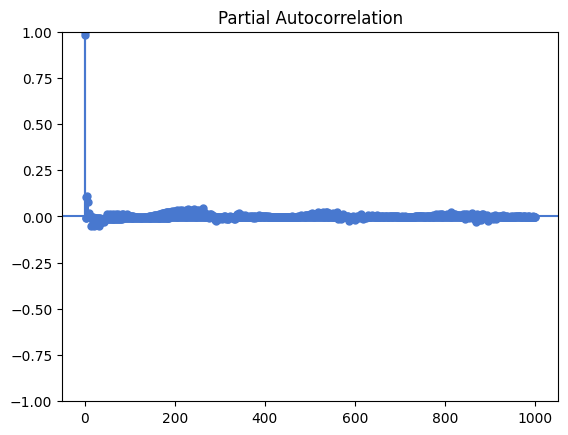

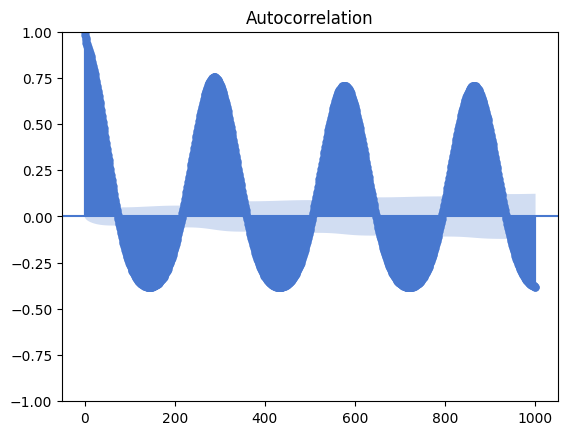

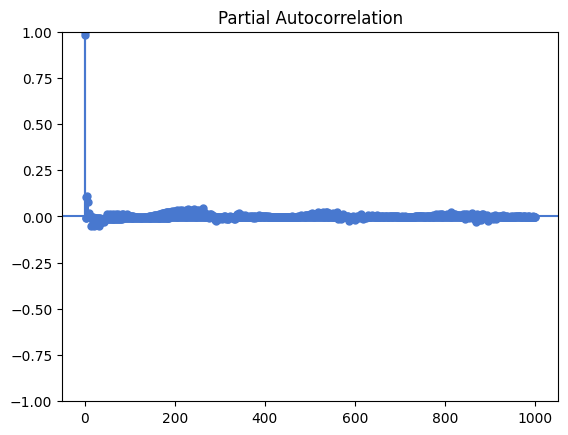

In [74]:
plot_acf(df_global_radiation, lags = 1000)
plot_pacf(df_global_radiation, lags = 1000)

In [75]:
# Split test and train set 
df_global_radiation_train = int(len(df_global_radiation)*0.8)
df_global_radiation_train ,df_global_radiation_test = df_global_radiation[:df_global_radiation_train], df_global_radiation[df_global_radiation_train:]

# Create and train the autoregressive model
ar_model_global_radiation = AutoReg(df_global_radiation_train, lags=288)
ar_model_global_radiation = ar_model_global_radiation.fit()
y_pred_global_radiation = ar_model_global_radiation.predict(start=len(df_global_radiation_train), end=len(df_global_radiation_train) + len(df_global_radiation_test)-1)

#Performance of autoregressive model for global_radiation
print("MSE Autogressive model global_Radiation:", mse(df_global_radiation_test, y_pred_global_radiation))

MSE Autogressive model global_Radiation: 16988.38882916867


# Nested Random Forest Predictions and Daily forecast for passengers' inflow

As of now, the Random Forest models that we trained are only able to predict the inflow of passengers in the bus stops in the next period, which corresponds to the next five minutes. The models cannot predict further than these 5 minutes as future inputs of the models are, obviuosly, unknown.

In the following we construct our final Random Forest models, which can produce a forecast over longer periods by using predictions for each period as inputs for the predictions of the following ones. The idea behind these models is that we only predict the passengers' inflow in the next 5 minute and then use that prediction as a new input variable that takes place of the variable t-1 of the previous period. Concurrently, the variable t-288 of the period preceding the period of the computed prediction is dropped, as its place is now taken by what used to be t-287 in the previous period. This way, at each iteration, the models can generate their prediction for the following period on the basis of the passengers' inflow over the previous 24 hours (288 five minutes intervals).

The models also keep track of date and time, updating the start date and time (which need to be given as input), so that at each iteration they can assess whether it is a holiday (meaning an official Holiday, Saturday or Sunday) and adjust their prediction accordingly. 

The previously developed autoregressive model for global_radiation, then, provides a forecast for the global_radiation feature over the forecasting horizon, that can be used as input by the models.

In [76]:
# Create predictor function for ost
def occupancy_predictor_ost(X, pred_span, time):
    X_nl = X.copy() #Create a copy of the input data
    X_nl.index = X_nl.index.map(lambda x: 0 if x != 0 else x)
    start = len(X)
    end = start + pred_span -1 #compute end of forecast¨
    from datetime import timedelta #import timedelta for later use

    #Predict weather conditions for predicted time span
    global_radiation_pred = ar_model_global_radiation.predict(start = start, end = end, dynamic = False)

    results_ost =[] #Create list that will store predictions for each period t
    list_columns = X.columns.to_list() #Create a list with names of the columns of input X

    # Create date range for 2024
    dates = pd.date_range(start="2024-01-01", end="2024-12-31", freq="D")

    #Store holidays of the year
    feiertage = pd.DataFrame({
	    "Date": ["2024-01-01", "2024-01-02", "2024-03-28", "2024-03-29", "2024-04-01", "2024-04-15", "2024-05-01", "2024-05-08", "2024-05-09",
              "2024-05-10", "2024-05-20", "2024-08-01", "2024-09-09", "2024-12-24", "2024-12-25", "2024-12-26", "2024-12-27", "2024-12-30",
              "2024-12-31"]
        })

    feiertage["Date"] = pd.to_datetime(feiertage["Date"]) #Convert Date into datetime format
    feiertage["Holiday"] = 1 #Add columns that tells whether it is a holiday or not

    
    # Create a separate calendar with names of the days of the week
    calendar = pd.DataFrame({
        "Date": dates,
        "Day": dates.day_name()  
    })
    calendar["Date"] = pd.to_datetime(calendar["Date"]) #Convert date column into datetime format
    calendar["Holiday"] = 0 #Add colums for Holiday with only 0 as values initially
    calendar["Holiday"] = np.where(calendar["Date"].isin(feiertage["Date"]), 1, 0) # Put value 1 for Holiday for obs are actually a holiday
    calendar.loc[calendar["Day"].isin(["Saturday", "Sunday"]), "Holiday"] = 1 #Consider weekends as holidays as as well 

    calendar.drop(columns = "Day", inplace = True) #Drop "Day" feature (not needed anymore)

    #Define function to extend calendar to have frequency of 5 minutes
    def extend_calendar(z):
        extended_z = [] # Create a list to hold the expanded data
    
        for _, row in z.iterrows():
        
            date = pd.Timestamp(row['Date']).date()
            holiday_value = row['Holiday']
        
            # Generate 5-minute intervals for the whole day
            time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")
        
            # Append each timestamp with the holiday value
            extended_z.extend([(timestamp, holiday_value) for timestamp in time_range])
    
        # Create a new DataFrame from the expanded data
        extended_calendar = pd.DataFrame(extended_z, columns=["Timestamp", "Holiday"])
        return extended_calendar

    complete_calendar = extend_calendar(calendar) #Extend calendar to have 5 min frequency

    Date = pd.to_datetime(time)+ timedelta(minutes = 5) #Create variable that keeps track of date and time starting from next period

    for i in range (0, pred_span):
        #Insert predictions for weather
        X_nl.loc[0, "global_radiation"] = global_radiation_pred.values[i]

        #Determine whether next period is a holiday or not
        next_period = Date + timedelta(minutes = 5*i)
        if ((complete_calendar["Timestamp"] == next_period) & (complete_calendar["Holiday"] == 1)).any() == True:
            X_nl["Holiday"] = 1
        else:
            X_nl["Holiday"] = 0
        

        #Compute prediction for next period 
        y_prediction = RF_ost_reduced.predict(X_nl.loc[[0]])

        #Insert prediction for y as new column in the input X_ln (left side)
        X_nl = pd.concat([pd.DataFrame(y_prediction), X_nl.loc[[0]]], axis = 1) #insert predicition as last recorded value in updated dataset
        X_nl.drop(columns = X_nl.iloc[:, 288].name, inplace = True) #Drop the oldest recorded value in previous period
        X_nl.columns = list_columns #rename columns as they were at beginning
        results_ost.append(y_prediction)

    return results_ost

In [77]:
# Create predictor function for west
def occupancy_predictor_west(X, pred_span, time):
    X_nl = X.copy() #Create a copy of the input data
    X_nl.index = X_nl.index.map(lambda x: 0 if x != 0 else x)
    start = len(X)
    end = start + pred_span -1 #compute end of forecast¨
    from datetime import timedelta #import timedelta for later use

    #Predict weather conditions for predicted time span
    global_radiation_pred = ar_model_global_radiation.predict(start = start, end = end, dynamic = False)

    results_west =[] #Create list that will store predictions for each period t
    list_columns = X.columns.to_list() #Create a list with names of the columns of input X

    # Create date range for 2024
    dates = pd.date_range(start="2024-01-01", end="2024-12-31", freq="D")

    #Store holidays of the year
    feiertage = pd.DataFrame({
	    "Date": ["2024-01-01", "2024-01-02", "2024-03-28", "2024-03-29", "2024-04-01", "2024-04-15", "2024-05-01", "2024-05-08", "2024-05-09",
              "2024-05-10", "2024-05-20", "2024-08-01", "2024-09-09", "2024-12-24", "2024-12-25", "2024-12-26", "2024-12-27", "2024-12-30",
              "2024-12-31"]
        })

    feiertage["Date"] = pd.to_datetime(feiertage["Date"]) #Convert Date into datetime format
    feiertage["Holiday"] = 1 #Add columns that tells whether it is a holiday or not

    # Create a separate calendar with names of the days of the week
    calendar = pd.DataFrame({
        "Date": dates,
        "Day": dates.day_name()  
    })
    calendar["Date"] = pd.to_datetime(calendar["Date"]) #Convert date column into datetime format
    calendar["Holiday"] = 0 #Add colums for Holiday with only 0 as values initially
    calendar["Holiday"] = np.where(calendar["Date"].isin(feiertage["Date"]), 1, 0) # Put value 1 for Holiday for obs are actually a holiday
    calendar.loc[calendar["Day"].isin(["Saturday", "Sunday"]), "Holiday"] = 1 #Consider weekends as holidays as as well 

    calendar.drop(columns = "Day", inplace = True) #Drop "Day" feature (not needed anymore)

    #Define function to extend calendar to have frequency of 5 minutes
    def extend_calendar(z):
        extended_z = [] # Create a list to hold the expanded data
    
        for _, row in z.iterrows():
        
            date = pd.Timestamp(row['Date']).date()
            holiday_value = row['Holiday']
        
            # Generate 5-minute intervals for the whole day
            time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")
        
            # Append each timestamp with the holiday value
            extended_z.extend([(timestamp, holiday_value) for timestamp in time_range])
    
        # Create a new DataFrame from the expanded data
        extended_calendar = pd.DataFrame(extended_z, columns=["Timestamp", "Holiday"])
        return extended_calendar

    complete_calendar = extend_calendar(calendar) #Extend calendar to have 5 min frequency

    Date = pd.to_datetime(time)+ timedelta(minutes = 5) #Create variable that keeps track of date and time starting from next period

    for i in range (0, pred_span):
        #Insert predictions for weather
        X_nl.loc[0, "global_radiation"] = global_radiation_pred.values[i]

        #Determine whether next period is a holiday or not
        next_period = Date + timedelta(minutes = 5*i)
        if ((complete_calendar["Timestamp"] == next_period) & (complete_calendar["Holiday"] == 1)).any() == True:
            X_nl["Holiday"] = 1
        else:
            X_nl["Holiday"] = 0
        

        #Compute prediction for next period 
        y_prediction = RF_west_reduced.predict(X_nl.loc[[0]])

        #Insert prediction for y as new column in the input X_ln (left side)
        X_nl = pd.concat([pd.DataFrame(y_prediction), X_nl.loc[[0]]], axis = 1) #insert predicition as last recorded value in updated dataset
        X_nl.drop(columns = X_nl.iloc[:, 288].name, inplace = True) #Drop the oldest recorded value in previous period
        X_nl.columns = list_columns #rename columns as they were at beginning
        results_west.append(y_prediction)

    return results_west

In [ ]:
#Define inputs
x1 = X_ost_test_reduced.iloc[[0]].copy() #one row input for occupancy_predictor_ost
x2 = X_west_test_reduced.iloc[[0]].copy() #one row input for occupancy_predictor_west
time = "2024-09-19 00:00:00" #date and time corresponding to input data
pred_span = 288 #Forecasting horizon 

pred_ost = occupancy_predictor_ost(x1, pred_span, time)
pred_west = occupancy_predictor_west(x2, pred_span, time)
print("Model Ost MSE:", mse(y_ost_test[0:288], pred_ost))
print("Model west MSE:", mse(y_west_test[0:288], pred_west))

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\656128163.py:51: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2612134090.py:50: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")


Ost ww MSE: 204.43359670138886
Ost ww MSE: 81.02887747395833


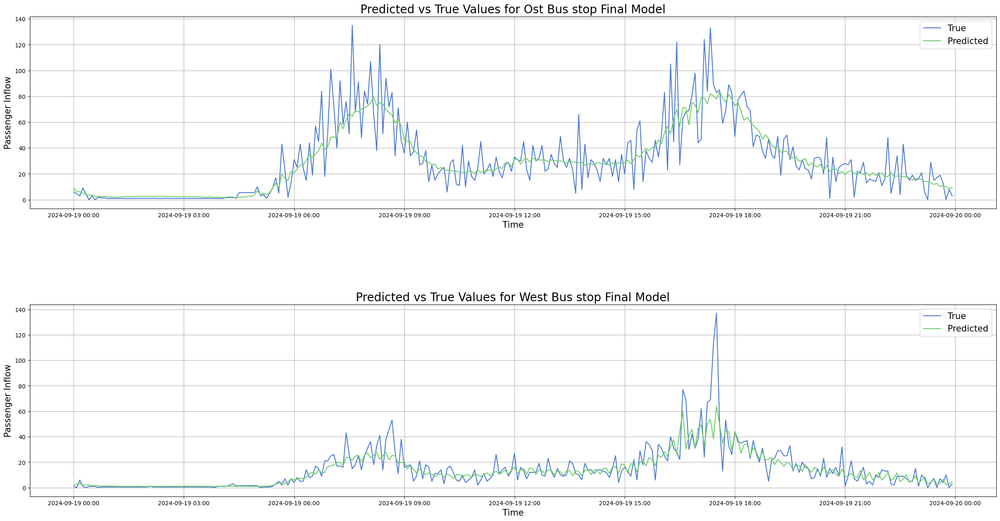

In [79]:
#Plot forecast for 19th of september 2024 for both west and ost bus stops against true values
fig, axs = plt.subplots(2,1,figsize=(30, 15))

time_range = pd.date_range(start='2024-09-19 00:00:00', end='2024-09-19 23:55:00', freq='5min')

axs[0].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter("%Y-%m-%d %H:%M"))
axs[0].plot(time_range, y_ost_test[0:288], label = "True")
axs[0].plot(time_range, pred_ost, label = "Predicted")
axs[0].legend(fontsize = 15)
axs[0].set_title("Predicted vs True Values for Ost Bus stop Final Model", fontsize = 20)
axs[0].set_xlabel("Time", fontsize = 15)
axs[0].set_ylabel("Passenger Inflow", fontsize = 15)
axs[0].grid(True)

axs[1].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter("%Y-%m-%d %H:%M"))
axs[1].plot(time_range, y_west_test[0:288], label = "True")
axs[1].plot(time_range, pred_west, label = "Predicted")
axs[1].legend(fontsize = 15)
axs[1].set_title("Predicted vs True Values for West Bus stop Final Model", fontsize = 20)
axs[1].set_xlabel("Time", fontsize = 15)
axs[1].set_ylabel("Passenger Inflow", fontsize = 15)
axs[1].grid(True)

plt.subplots_adjust(hspace = 0.5)

In [80]:
#Produce forecast for day after last observation of Test set
#Define inputs
x3 = X_ost_test_reduced.tail(1).copy()
x4 = X_west_test_reduced.tail(1).copy()
time = "2024-11-15 23:55:00"
pred_span = 288

y_forecast_ost = occupancy_predictor_ost(x3, pred_span, time)
y_forecast_west = occupancy_predictor_west(x4, pred_span, time)

C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\656128163.py:51: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")
C:\Users\kaito\AppData\Local\Temp\ipykernel_14508\2612134090.py:50: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  time_range = pd.date_range(start=f"{date} 00:00:00", end=f"{date} 23:55:00", freq="5T")


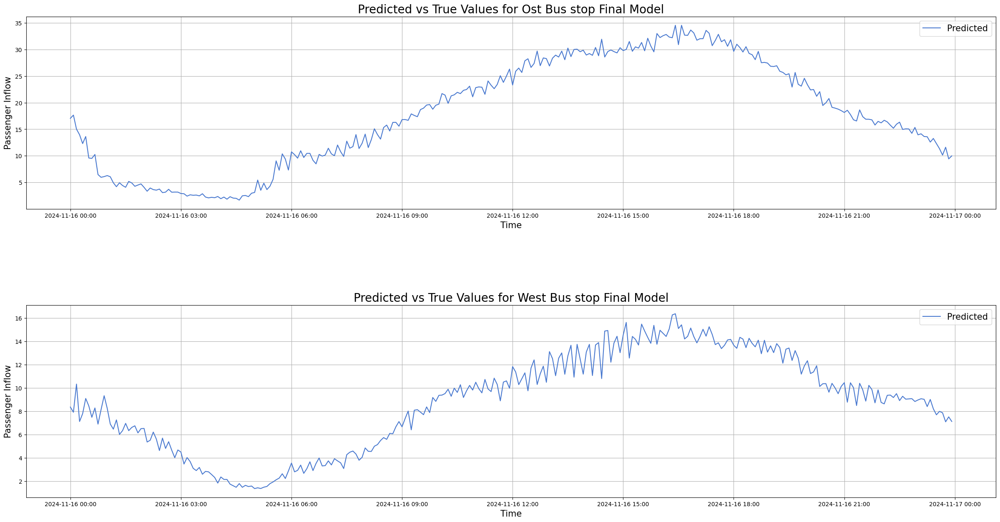

In [81]:
#Plot both forecasts for west and ost
fig, axs = plt.subplots(2,1,figsize=(30, 15))

time_range = pd.date_range(start='2024-11-16 00:00:00', end='2024-11-16 23:55:00', freq='5min')

axs[0].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter("%Y-%m-%d %H:%M"))
axs[0].plot(time_range, y_forecast_ost, label = "Predicted")
axs[0].legend(fontsize = 15)
axs[0].set_title("Predicted vs True Values for Ost Bus stop Final Model", fontsize = 20)
axs[0].set_xlabel("Time", fontsize = 15)
axs[0].set_ylabel("Passenger Inflow", fontsize = 15)
axs[0].grid(True)

axs[1].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter("%Y-%m-%d %H:%M"))
axs[1].plot(time_range, y_forecast_west, label = "Predicted")
axs[1].legend(fontsize = 15)
axs[1].set_title("Predicted vs True Values for West Bus stop Final Model", fontsize = 20)
axs[1].set_xlabel("Time", fontsize = 15)
axs[1].set_ylabel("Passenger Inflow", fontsize = 15)
axs[1].grid(True)

plt.subplots_adjust(hspace = 0.5)